<a href="https://colab.research.google.com/github/dkbean/Improved-stability-of-WGAN-GP/blob/main/4.%20WGAN-GP%20Anime%20(implement%20learning%20rate%20schedule).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir generator

In [ ]:
#Create folders to save 3000 generated images for each n epochs
import os
import subprocess

n=10
# Specify the base folder where you want to create the subfolders
base_folder = ""  # Replace with your desired base folder path


# Create 15 folders with the specified naming pattern
for x in range(0, 801, n):
    folder_name = f'animeGenerated_wgan_{x}epochs'
    folder_path = os.path.join(base_folder, folder_name)

    try:
        os.makedirs(folder_path)
        print(f"Created folder: {folder_path}")
    except FileExistsError:
        print(f"Folder already exists: {folder_path}")

print("Folders created successfully.")

Created folder: animeGenerated_wgan_0epochs
Created folder: animeGenerated_wgan_10epochs
Created folder: animeGenerated_wgan_20epochs
Created folder: animeGenerated_wgan_30epochs
Created folder: animeGenerated_wgan_40epochs
Created folder: animeGenerated_wgan_50epochs
Created folder: animeGenerated_wgan_60epochs
Created folder: animeGenerated_wgan_70epochs
Created folder: animeGenerated_wgan_80epochs
Created folder: animeGenerated_wgan_90epochs
Created folder: animeGenerated_wgan_100epochs
Created folder: animeGenerated_wgan_110epochs
Created folder: animeGenerated_wgan_120epochs
Created folder: animeGenerated_wgan_130epochs
Created folder: animeGenerated_wgan_140epochs
Created folder: animeGenerated_wgan_150epochs
Created folder: animeGenerated_wgan_160epochs
Created folder: animeGenerated_wgan_170epochs
Created folder: animeGenerated_wgan_180epochs
Created folder: animeGenerated_wgan_190epochs
Created folder: animeGenerated_wgan_200epochs
Created folder: animeGenerated_wgan_210epochs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pytorch-fid

In [ ]:
# !pip uninstall tensorflow -y
#

In [ ]:
# !pip install  tensorflow==2.14.0

In [ ]:
!unzip /content/drive/MyDrive/anime_test.zip -d ./

Archive:  /content/drive/MyDrive/anime_test.zip
   creating: ./anime_test/
  inflating: ./anime_test/anime_3001.jpg  
  inflating: ./anime_test/anime_3002.jpg  
  inflating: ./anime_test/anime_3003.jpg  
  inflating: ./anime_test/anime_3004.jpg  
  inflating: ./anime_test/anime_3005.jpg  
  inflating: ./anime_test/anime_3006.jpg  
  inflating: ./anime_test/anime_3007.jpg  
  inflating: ./anime_test/anime_3008.jpg  
  inflating: ./anime_test/anime_3009.jpg  
  inflating: ./anime_test/anime_3010.jpg  
  inflating: ./anime_test/anime_3011.jpg  
  inflating: ./anime_test/anime_3012.jpg  
  inflating: ./anime_test/anime_3013.jpg  
  inflating: ./anime_test/anime_3014.jpg  
  inflating: ./anime_test/anime_3015.jpg  
  inflating: ./anime_test/anime_3016.jpg  
  inflating: ./anime_test/anime_3017.jpg  
  inflating: ./anime_test/anime_3018.jpg  
  inflating: ./anime_test/anime_3019.jpg  
  inflating: ./anime_test/anime_3020.jpg  
  inflating: ./anime_test/anime_3021.jpg  
  inflating: ./anime_t

In [ ]:
!unzip /content/drive/MyDrive/anime_train.zip -d ./

Streaming output truncated to the last 5000 lines.
  inflating: ./anime_train/anime_60006.jpg  
  inflating: ./anime_train/anime_60007.jpg  
  inflating: ./anime_train/anime_60008.jpg  
  inflating: ./anime_train/anime_60009.jpg  
  inflating: ./anime_train/anime_6001.jpg  
  inflating: ./anime_train/anime_60010.jpg  
  inflating: ./anime_train/anime_60011.jpg  
  inflating: ./anime_train/anime_60012.jpg  
  inflating: ./anime_train/anime_60013.jpg  
  inflating: ./anime_train/anime_60014.jpg  
  inflating: ./anime_train/anime_60015.jpg  
  inflating: ./anime_train/anime_60016.jpg  
  inflating: ./anime_train/anime_60017.jpg  
  inflating: ./anime_train/anime_60018.jpg  
  inflating: ./anime_train/anime_60019.jpg  
  inflating: ./anime_train/anime_6002.jpg  
  inflating: ./anime_train/anime_60020.jpg  
  inflating: ./anime_train/anime_60021.jpg  
  inflating: ./anime_train/anime_60022.jpg  
  inflating: ./anime_train/anime_60023.jpg  
  inflating: ./anime_train/anime_60024.jpg  
  infl

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [ ]:
! pwd


/content


In [ ]:
print(tf.version.VERSION)

2.15.0


In [ ]:
anime_data_dir = "/content/anime_train"

In [ ]:
FID_scores = []
def lastWord(string): # get the FID score from the FID command's result

    # split by space and converting
    # string to list and
    lis = list(string.split(" "))

    # length of list
    length = len(lis)

    # returning last element in list
    return lis[length-1]

In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    anime_data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # Margaret: increase batch size from 32
)

Found 60565 files belonging to 1 classes.


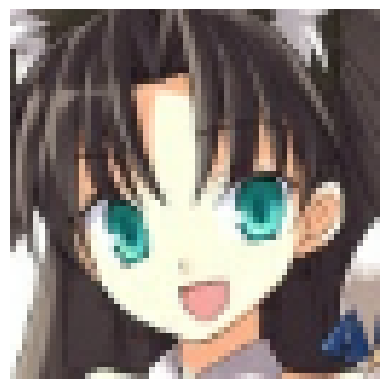

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i])
        plt.imshow(img)
        plt.axis('off')
    plt.show()

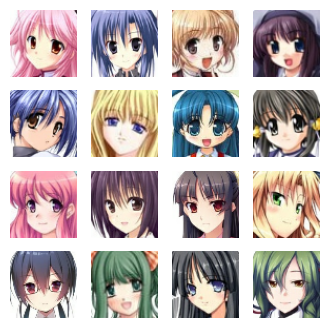

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 128

WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3

In [ ]:
def build_generator():
    # create a Keras Sequential model
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             4227072   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 256)       2097152   
 anspose)                                                        
                                                                 
 batch_normalization (Batch  (None, 16, 16, 256)       1024      
 Normalization)                                                  
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0 

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4),
                            padding="same",
                            strides=(2, 2),
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # linear activation in the last layer
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3)

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0    

In [ ]:
class WGAN_GP(keras.Model):
    def __init__(self,
                 critic,
                 generator,
                 latent_dim,
                 critic_extra_steps,
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """

        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps)
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True)
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        if epoch % n == 0:
          fig = plt.figure(figsize=(4, 4))
          for i in range(self.num_img):
              plt.subplot(4, 4, i+1)
              img = keras.utils.array_to_img(generated_images[i])
              plt.imshow(img)
              plt.axis('off')
          plt.savefig('epoch_{:03d}.png'.format(epoch))
          plt.show()

        # calculate FID for each n epochs
        epoch_num = epoch
        if epoch % n == 0:
          folder_name = "animeGenerated_wgan_" + str(epoch_num) + "epochs"
          print(folder_name)

          noise_size = 128
          seed = tf.random.normal([3001, noise_size])
          generated_images = self.model.generator(seed)
          generated_images = (generated_images * 127.5) + 127.5
          generated_images.numpy()

          # fig = plt.figure(figsize=(4, 4))
          for i in range(1,3001):
              img = keras.utils.array_to_img(generated_images[i])
              img.save(folder_name + "/anime_%d.jpg" % (i))

          self.model.generator.save('generator/generator'+ str(epoch_num) +'.h5')

          # Construct the command to run
          cmd = f"python -m pytorch_fid /content/anime_test /content/{folder_name}"

          # Print the captured output
          try:
            output = subprocess.check_output(cmd, shell=True, text=True)
            print(f"Output of the calculating FID command:\n{output}")
            fid_val = float(lastWord(output))
            FID_scores.append(fid_val)
            print("FID_scores: ",FID_scores)
            # Display the current plot
            if len(FID_scores) > 10:  # only display when the FID_scores size > 10
              # Create sample data
              epochs = np.arange(0, len(FID_scores)*n, n)  # Values from 0 with a step of 10
              fid_scores = np.array(FID_scores)
              print(fid_scores)
              # Find the minimum FID score and its corresponding epoch
              min_fid_score = min(fid_scores)
              min_fid_epoch = epochs[fid_scores.argmin()]
              # Create the plot
              plt.figure(figsize=(8, 6))
              plt.plot(epochs, fid_scores, marker='o', linestyle='-')
              plt.title('FID Score Over Epochs')
              plt.xlabel('Epoch num')
              plt.ylabel('FID score')
              plt.grid(True)
              # Annotate the minimum point with a rotated text and a straight arrow
              arrow_props = dict(arrowstyle='->', connectionstyle='arc3,rad=1')
              plt.annotate(f'Min FID Score: {min_fid_score:.2f}', xy=(min_fid_epoch, min_fid_score), xytext=(min_fid_epoch + 20, min_fid_score + 10.1),
                          arrowprops=arrow_props, rotation=0, va='bottom')
              # Highlight the minimum point with a red dot
              plt.scatter(min_fid_epoch, min_fid_score, color='red', s=100, label='Min FID Score')
              # Display the plot
              plt.show()

          except subprocess.CalledProcessError as e:
            # Handle any errors that may occur during command execution
            print(f"Error running command: {e}")


    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan_gp = WGAN_GP(critic=critic,
              generator=generator,
              latent_dim=LATENT_DIM,
              critic_extra_steps=5)

In [ ]:
# NEW
# Define learning rate schedules
d_lr_schedule = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.00013, decay_steps=10000, decay_rate=0.9)

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.0001
d_optimizer = keras.optimizers.Adam(learning_rate=d_lr_schedule, beta_1=0, beta_2=0.9)
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [ ]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

In [ ]:
# NEW
# Add learning rate scheduling callback
lr_scheduler = keras.callbacks.LearningRateScheduler(lambda epoch: d_lr_schedule(epoch).numpy())

Epoch 1/802
237/237 [==============================] - ETA: 0s - d_loss: -29.2491 - g_loss: 22.6837

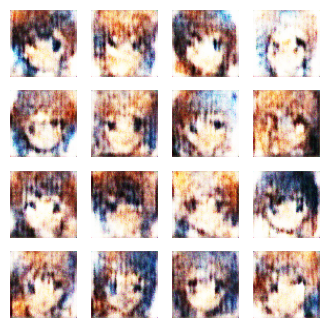

animeGenerated_wgan_0epochs


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Output of the calculating FID command:
FID:  349.09119950908666

FID_scores:  [349.09119950908666]
237/237 [==============================] - 90s 319ms/step - d_loss: -29.2491 - g_loss: 22.6837 - lr: 1.3000e-04
Epoch 2/802
237/237 [==============================] - 33s 137ms/step - d_loss: -12.2546 - g_loss: -5.6813 - lr: 1.3000e-04
Epoch 3/802
237/237 [==============================] - 33s 137ms/step - d_loss: -9.1518 - g_loss: -35.8887 - lr: 1.3000e-04
Epoch 4/802
237/237 [==============================] - 33s 137ms/step - d_loss: -8.2052 - g_loss: -54.8001 - lr: 1.3000e-04
Epoch 5/802
237/237 [==============================] - 32s 137ms/step - d_loss: -7.2255 - g_loss: -39.7143 - lr: 1.2999e-04
Epoch 6/802
237/237 [==============================] - 33s 137ms/step - d_loss: -6.9968 - g_loss: -31.1502 - lr: 1.2999e-04
Epoch 7/802
237/237 [==============================] - 32s 137ms/step - d_loss: -6.6526 - g_loss: -18.6224 - lr: 1.2999e-04
Epoch 8/802
237/237 [========================

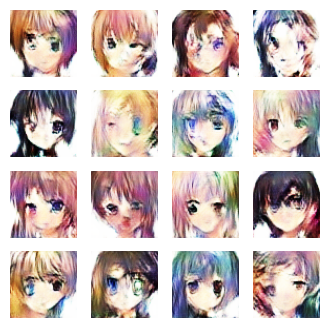

animeGenerated_wgan_10epochs


Output of the calculating FID command:
FID:  109.76413077383626

FID_scores:  [349.09119950908666, 109.76413077383626]
237/237 [==============================] - 49s 208ms/step - d_loss: -5.5223 - g_loss: -5.7965 - lr: 1.2999e-04
Epoch 12/802
237/237 [==============================] - 33s 137ms/step - d_loss: -5.4103 - g_loss: -1.4125 - lr: 1.2998e-04
Epoch 13/802
237/237 [==============================] - 32s 137ms/step - d_loss: -4.8952 - g_loss: -0.1914 - lr: 1.2998e-04
Epoch 14/802
237/237 [==============================] - 32s 137ms/step - d_loss: -4.4478 - g_loss: 0.7729 - lr: 1.2998e-04
Epoch 15/802
237/237 [==============================] - 33s 137ms/step - d_loss: -4.2130 - g_loss: 4.2730 - lr: 1.2998e-04
Epoch 16/802
237/237 [==============================] - 33s 137ms/step - d_loss: -3.9976 - g_loss: 4.8500 - lr: 1.2998e-04
Epoch 17/802
237/237 [==============================] - 32s 137ms/step - d_loss: -3.7948 - g_loss: 6.0937 - lr: 1.2998e-04
Epoch 18/802
237/237 [========

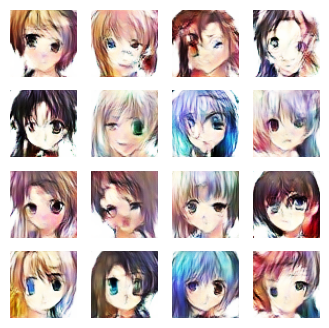

animeGenerated_wgan_20epochs


Output of the calculating FID command:
FID:  67.63711724419446

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446]
237/237 [==============================] - 50s 210ms/step - d_loss: -3.3373 - g_loss: 4.5675 - lr: 1.2997e-04
Epoch 22/802
237/237 [==============================] - 33s 137ms/step - d_loss: -3.1861 - g_loss: 2.2570 - lr: 1.2997e-04
Epoch 23/802
237/237 [==============================] - 33s 137ms/step - d_loss: -3.1127 - g_loss: 1.1891 - lr: 1.2997e-04
Epoch 24/802
237/237 [==============================] - 32s 137ms/step - d_loss: -3.0761 - g_loss: -0.4616 - lr: 1.2997e-04
Epoch 25/802
237/237 [==============================] - 33s 137ms/step - d_loss: -2.9893 - g_loss: -2.5325 - lr: 1.2997e-04
Epoch 26/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.9636 - g_loss: -3.0159 - lr: 1.2997e-04
Epoch 27/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.8302 - g_loss: -3.1337 - lr: 1.2996e-04
Epoch 28/80

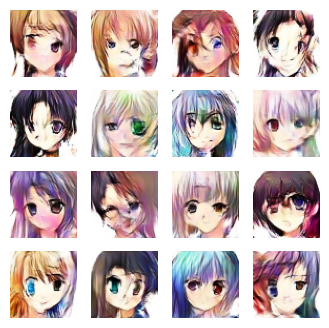

animeGenerated_wgan_30epochs


Output of the calculating FID command:
FID:  54.17792023468169

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169]
237/237 [==============================] - 49s 208ms/step - d_loss: -2.6365 - g_loss: -6.0390 - lr: 1.2996e-04
Epoch 32/802
237/237 [==============================] - 33s 137ms/step - d_loss: -2.5972 - g_loss: -6.8756 - lr: 1.2996e-04
Epoch 33/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.5020 - g_loss: -8.0143 - lr: 1.2996e-04
Epoch 34/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.4762 - g_loss: -7.9979 - lr: 1.2995e-04
Epoch 35/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.4023 - g_loss: -8.9653 - lr: 1.2995e-04
Epoch 36/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.3351 - g_loss: -9.9721 - lr: 1.2995e-04
Epoch 37/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.3006 - g_loss: -12.3338 - lr:

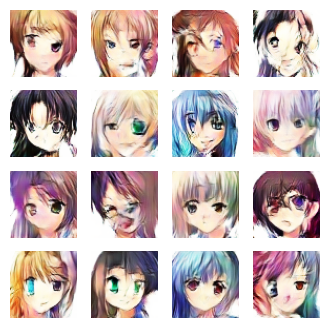

animeGenerated_wgan_40epochs


Output of the calculating FID command:
FID:  46.24512982697689

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689]
237/237 [==============================] - 49s 208ms/step - d_loss: -2.1347 - g_loss: -12.6229 - lr: 1.2995e-04
Epoch 42/802
237/237 [==============================] - 33s 137ms/step - d_loss: -2.1030 - g_loss: -12.7759 - lr: 1.2994e-04
Epoch 43/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.0442 - g_loss: -12.0256 - lr: 1.2994e-04
Epoch 44/802
237/237 [==============================] - 32s 137ms/step - d_loss: -2.0215 - g_loss: -12.3148 - lr: 1.2994e-04
Epoch 45/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.9796 - g_loss: -15.9014 - lr: 1.2994e-04
Epoch 46/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.9254 - g_loss: -12.6128 - lr: 1.2994e-04
Epoch 47/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.8457

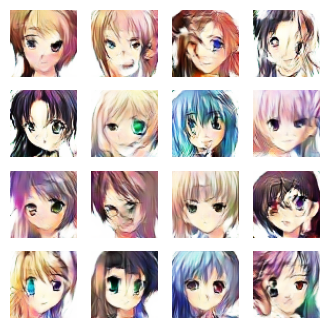

animeGenerated_wgan_50epochs


Output of the calculating FID command:
FID:  42.58554579167435

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435]
237/237 [==============================] - 49s 207ms/step - d_loss: -1.8339 - g_loss: -7.9911 - lr: 1.2993e-04
Epoch 52/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.7829 - g_loss: -9.8768 - lr: 1.2993e-04
Epoch 53/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.7361 - g_loss: -10.7213 - lr: 1.2993e-04
Epoch 54/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.7421 - g_loss: -12.6188 - lr: 1.2993e-04
Epoch 55/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.6898 - g_loss: -11.6743 - lr: 1.2993e-04
Epoch 56/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.6885 - g_loss: -9.0217 - lr: 1.2992e-04
Epoch 57/802
237/237 [==============================] - 32s 137ms/step -

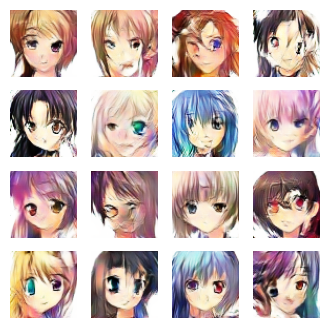

animeGenerated_wgan_60epochs


Output of the calculating FID command:
FID:  41.799834301086065

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065]
237/237 [==============================] - 49s 207ms/step - d_loss: -1.6036 - g_loss: -7.5001 - lr: 1.2992e-04
Epoch 62/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.5410 - g_loss: -5.3068 - lr: 1.2992e-04
Epoch 63/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.5203 - g_loss: -4.8956 - lr: 1.2992e-04
Epoch 64/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.5078 - g_loss: -6.6227 - lr: 1.2991e-04
Epoch 65/802
237/237 [==============================] - 32s 136ms/step - d_loss: -1.4588 - g_loss: -6.6311 - lr: 1.2991e-04
Epoch 66/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.4645 - g_loss: -6.3899 - lr: 1.2991e-04
Epoch 67/802
237/237 [==============================] 

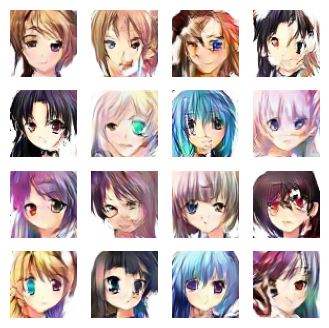

animeGenerated_wgan_70epochs


Output of the calculating FID command:
FID:  38.28413983024282

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282]
237/237 [==============================] - 49s 208ms/step - d_loss: -1.3707 - g_loss: -4.9060 - lr: 1.2990e-04
Epoch 72/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.2878 - g_loss: -4.5638 - lr: 1.2990e-04
Epoch 73/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.3260 - g_loss: -5.7805 - lr: 1.2990e-04
Epoch 74/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.3113 - g_loss: -5.5976 - lr: 1.2990e-04
Epoch 75/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.2976 - g_loss: -6.3976 - lr: 1.2990e-04
Epoch 76/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.2891 - g_loss: -6.5426 - lr: 1.2990e-04
Epoch 77/802
237/237 [==============

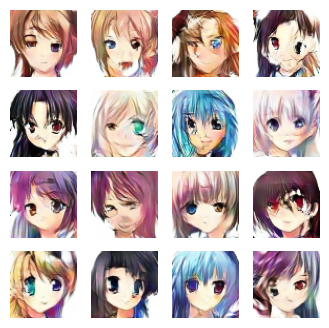

animeGenerated_wgan_80epochs


Output of the calculating FID command:
FID:  36.552672562889626

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626]
237/237 [==============================] - 49s 208ms/step - d_loss: -1.2373 - g_loss: -7.4204 - lr: 1.2989e-04
Epoch 82/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.2075 - g_loss: -6.7103 - lr: 1.2989e-04
Epoch 83/802
237/237 [==============================] - 32s 137ms/step - d_loss: -1.1933 - g_loss: -6.4126 - lr: 1.2989e-04
Epoch 84/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.1464 - g_loss: -6.5953 - lr: 1.2989e-04
Epoch 85/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.1436 - g_loss: -6.9202 - lr: 1.2988e-04
Epoch 86/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.1200 - g_loss: -7.6384 - lr: 1.2988e-04
Epoch 87/802
23

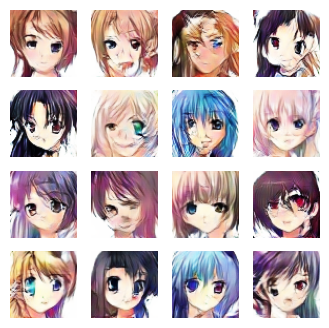

animeGenerated_wgan_90epochs


Output of the calculating FID command:
FID:  35.62966790121902

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902]
237/237 [==============================] - 49s 208ms/step - d_loss: -1.0658 - g_loss: -6.3755 - lr: 1.2988e-04
Epoch 92/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.0196 - g_loss: -8.0552 - lr: 1.2988e-04
Epoch 93/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.9993 - g_loss: -7.2708 - lr: 1.2987e-04
Epoch 94/802
237/237 [==============================] - 33s 137ms/step - d_loss: -1.0093 - g_loss: -7.5612 - lr: 1.2987e-04
Epoch 95/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.9932 - g_loss: -5.2131 - lr: 1.2987e-04
Epoch 96/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.9585 - g_loss: -4.7800 - lr: 1.2987e-

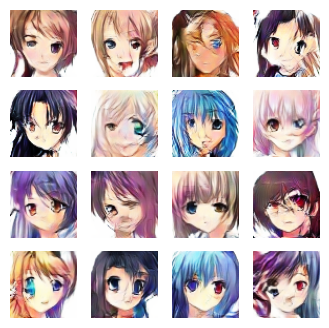

animeGenerated_wgan_100epochs


Output of the calculating FID command:
FID:  32.12131455903199

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456]


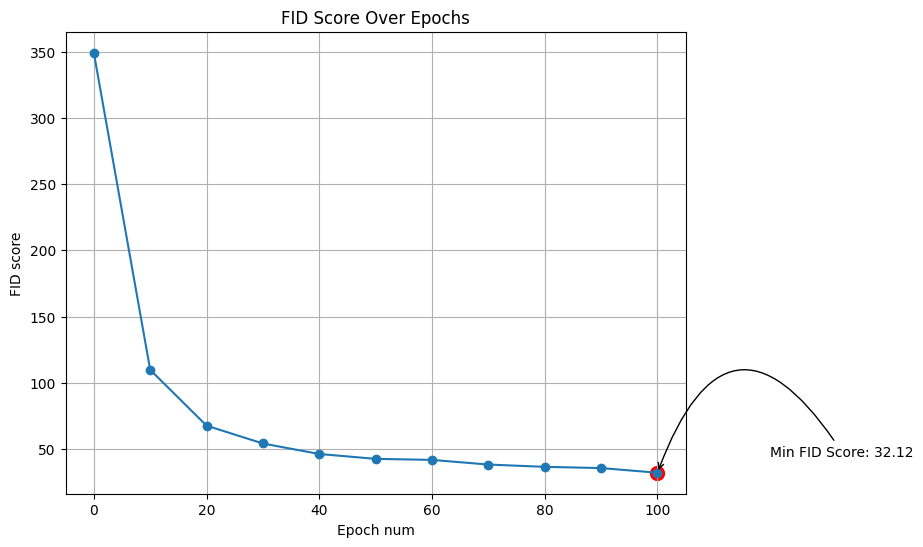

237/237 [==============================] - 49s 207ms/step - d_loss: -0.9088 - g_loss: -6.2940 - lr: 1.2986e-04
Epoch 102/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.9162 - g_loss: -5.8045 - lr: 1.2986e-04
Epoch 103/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.8448 - g_loss: -5.4771 - lr: 1.2986e-04
Epoch 104/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.8744 - g_loss: -4.0821 - lr: 1.2986e-04
Epoch 105/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.8517 - g_loss: -4.6804 - lr: 1.2986e-04
Epoch 106/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.8667 - g_loss: -4.5702 - lr: 1.2986e-04
Epoch 107/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.8642 - g_loss: -3.5821 - lr: 1.2985e-04
Epoch 108/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.8459 - g_loss: -4.9002 - lr: 1.2985e-04
Epoch 109/802


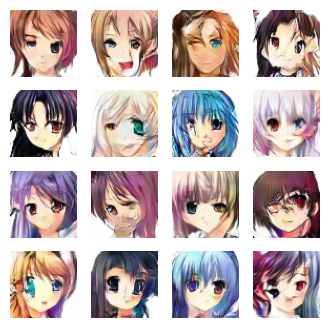

animeGenerated_wgan_110epochs


Output of the calculating FID command:
FID:  33.77152990459962

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299 ]


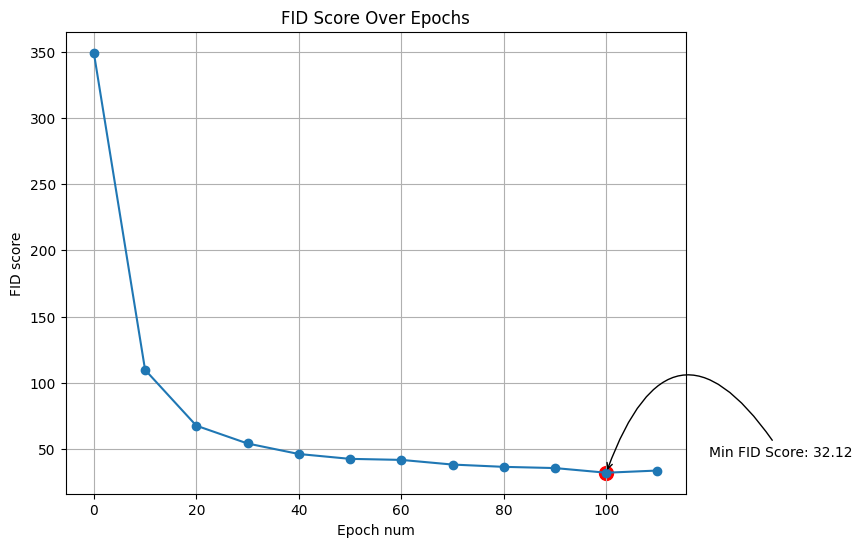

237/237 [==============================] - 50s 210ms/step - d_loss: -0.7930 - g_loss: -2.9818 - lr: 1.2985e-04
Epoch 112/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.7549 - g_loss: -3.2070 - lr: 1.2985e-04
Epoch 113/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.7858 - g_loss: -3.5724 - lr: 1.2985e-04
Epoch 114/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.7294 - g_loss: -3.1619 - lr: 1.2985e-04
Epoch 115/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.7560 - g_loss: -2.6925 - lr: 1.2984e-04
Epoch 116/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.7021 - g_loss: -2.7002 - lr: 1.2984e-04
Epoch 117/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.7322 - g_loss: -1.7125 - lr: 1.2984e-04
Epoch 118/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.7099 - g_loss: -2.9020 - lr: 1.2984e-04
Epoch 119/802


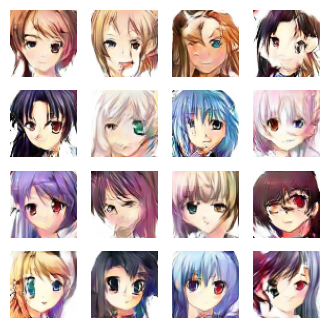

animeGenerated_wgan_120epochs


Output of the calculating FID command:
FID:  32.910100872136354

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087]


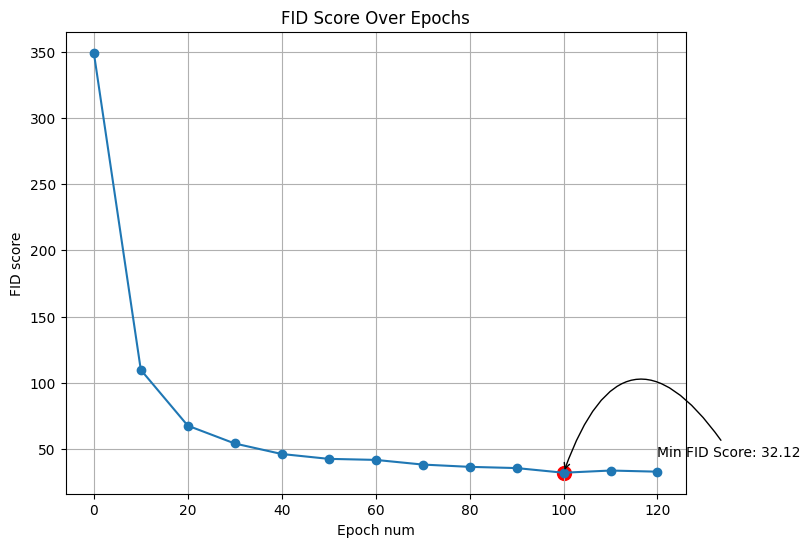

237/237 [==============================] - 49s 208ms/step - d_loss: -0.6626 - g_loss: -3.8005 - lr: 1.2984e-04
Epoch 122/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.6675 - g_loss: -3.3179 - lr: 1.2983e-04
Epoch 123/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.6595 - g_loss: -2.9643 - lr: 1.2983e-04
Epoch 124/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.6377 - g_loss: -3.4810 - lr: 1.2983e-04
Epoch 125/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.6521 - g_loss: -2.6506 - lr: 1.2983e-04
Epoch 126/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.6222 - g_loss: -3.8015 - lr: 1.2983e-04
Epoch 127/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.6452 - g_loss: -4.2207 - lr: 1.2983e-04
Epoch 128/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.5953 - g_loss: -3.1066 - lr: 1.2983e-04
Epoch 129/802


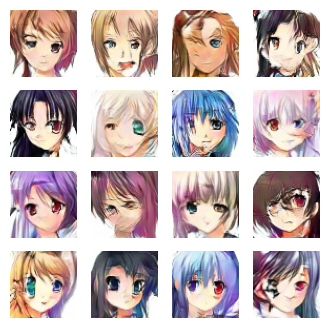

animeGenerated_wgan_130epochs


Output of the calculating FID command:
FID:  31.333193836872653

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384]


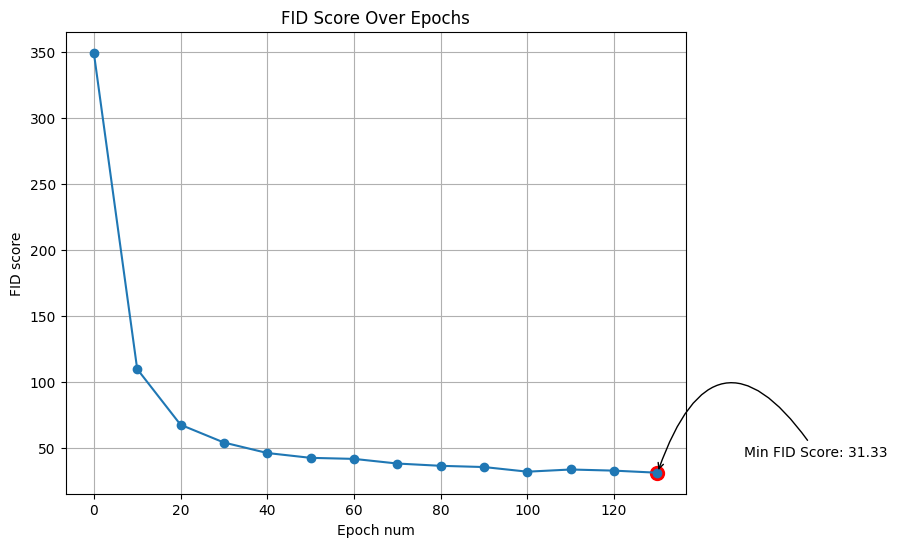

237/237 [==============================] - 50s 209ms/step - d_loss: -0.5653 - g_loss: -4.3226 - lr: 1.2982e-04
Epoch 132/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.5701 - g_loss: -5.5819 - lr: 1.2982e-04
Epoch 133/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.5721 - g_loss: -4.6551 - lr: 1.2982e-04
Epoch 134/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.5501 - g_loss: -4.6725 - lr: 1.2982e-04
Epoch 135/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.5319 - g_loss: -5.9818 - lr: 1.2982e-04
Epoch 136/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.5482 - g_loss: -4.3951 - lr: 1.2982e-04
Epoch 137/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.5004 - g_loss: -5.0443 - lr: 1.2981e-04
Epoch 138/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.5303 - g_loss: -5.0183 - lr: 1.2981e-04
Epoch 139/802


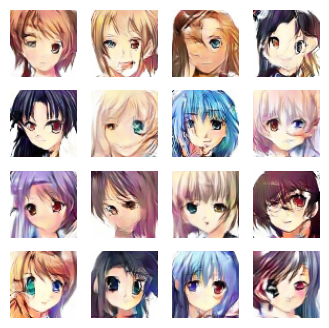

animeGenerated_wgan_140epochs


Output of the calculating FID command:
FID:  31.40649356927557

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357]


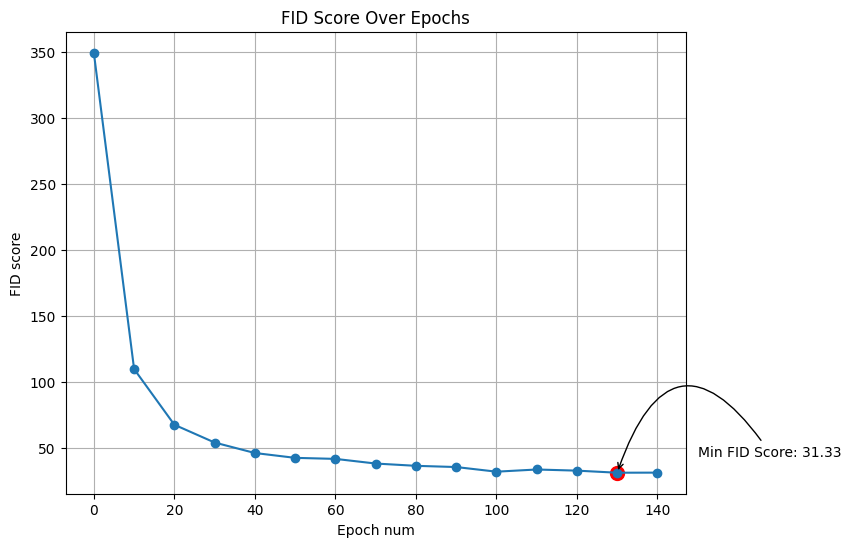

237/237 [==============================] - 49s 208ms/step - d_loss: -0.4676 - g_loss: -4.6116 - lr: 1.2981e-04
Epoch 142/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4844 - g_loss: -5.2318 - lr: 1.2981e-04
Epoch 143/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4692 - g_loss: -5.3026 - lr: 1.2981e-04
Epoch 144/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4623 - g_loss: -5.5277 - lr: 1.2980e-04
Epoch 145/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4437 - g_loss: -4.4848 - lr: 1.2980e-04
Epoch 146/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4305 - g_loss: -5.0319 - lr: 1.2980e-04
Epoch 147/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.4110 - g_loss: -5.7269 - lr: 1.2980e-04
Epoch 148/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.4011 - g_loss: -4.4955 - lr: 1.2980e-04
Epoch 149/802


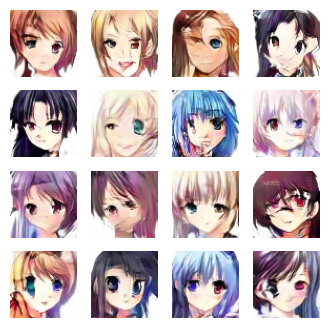

animeGenerated_wgan_150epochs


Output of the calculating FID command:
FID:  32.40944126385352

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126]


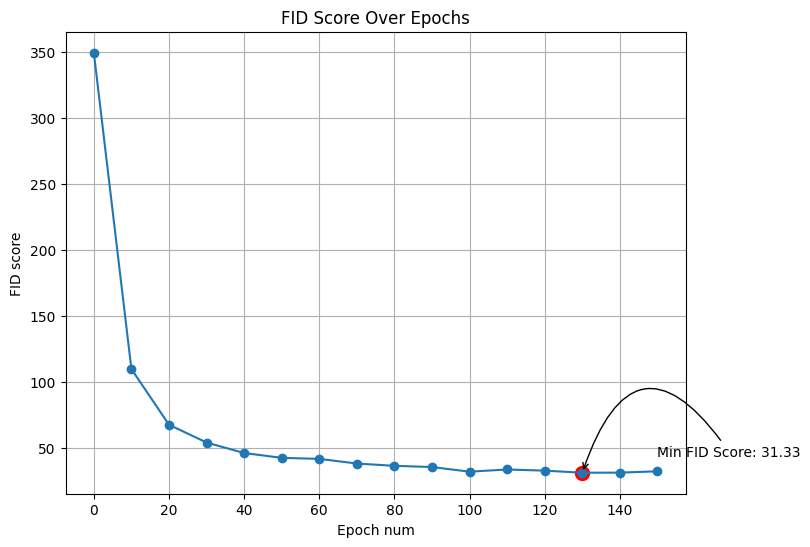

237/237 [==============================] - 49s 208ms/step - d_loss: -0.4301 - g_loss: -3.7817 - lr: 1.2979e-04
Epoch 152/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3659 - g_loss: -4.6485 - lr: 1.2979e-04
Epoch 153/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3841 - g_loss: -4.4491 - lr: 1.2979e-04
Epoch 154/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3649 - g_loss: -4.4890 - lr: 1.2979e-04
Epoch 155/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3859 - g_loss: -4.1678 - lr: 1.2979e-04
Epoch 156/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3873 - g_loss: -4.7557 - lr: 1.2979e-04
Epoch 157/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.3289 - g_loss: -5.4928 - lr: 1.2979e-04
Epoch 158/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3459 - g_loss: -5.9329 - lr: 1.2979e-04
Epoch 159/802


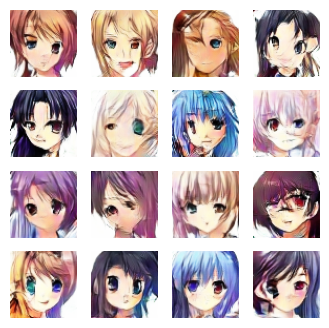

animeGenerated_wgan_160epochs


Output of the calculating FID command:
FID:  30.858607668473496

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767]


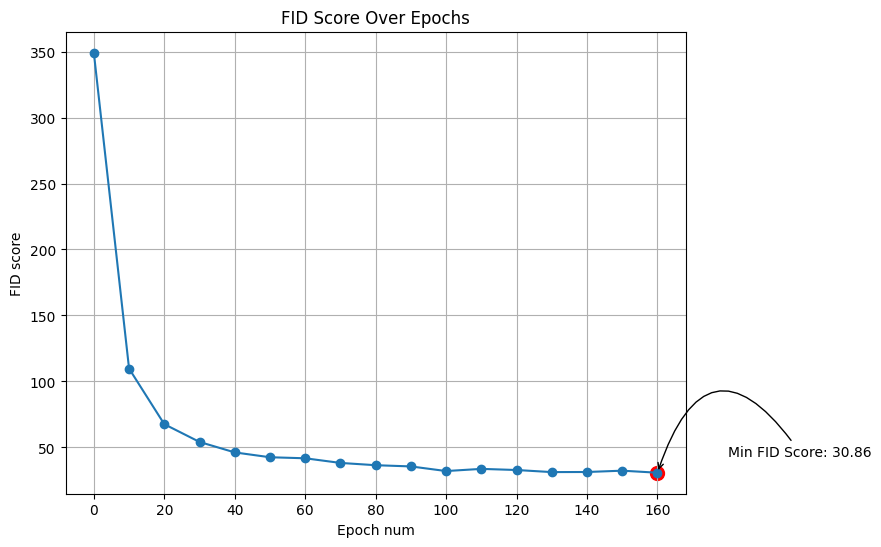

237/237 [==============================] - 49s 208ms/step - d_loss: -0.3117 - g_loss: -4.6878 - lr: 1.2978e-04
Epoch 162/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3075 - g_loss: -4.6612 - lr: 1.2978e-04
Epoch 163/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3281 - g_loss: -4.5857 - lr: 1.2978e-04
Epoch 164/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3050 - g_loss: -5.3878 - lr: 1.2978e-04
Epoch 165/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3245 - g_loss: -4.6281 - lr: 1.2978e-04
Epoch 166/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.3082 - g_loss: -4.2783 - lr: 1.2977e-04
Epoch 167/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.3094 - g_loss: -3.5148 - lr: 1.2977e-04
Epoch 168/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.2837 - g_loss: -4.6225 - lr: 1.2977e-04
Epoch 169/802


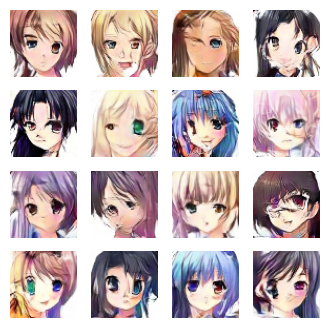

animeGenerated_wgan_170epochs


Output of the calculating FID command:
FID:  31.700946838710195

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684]


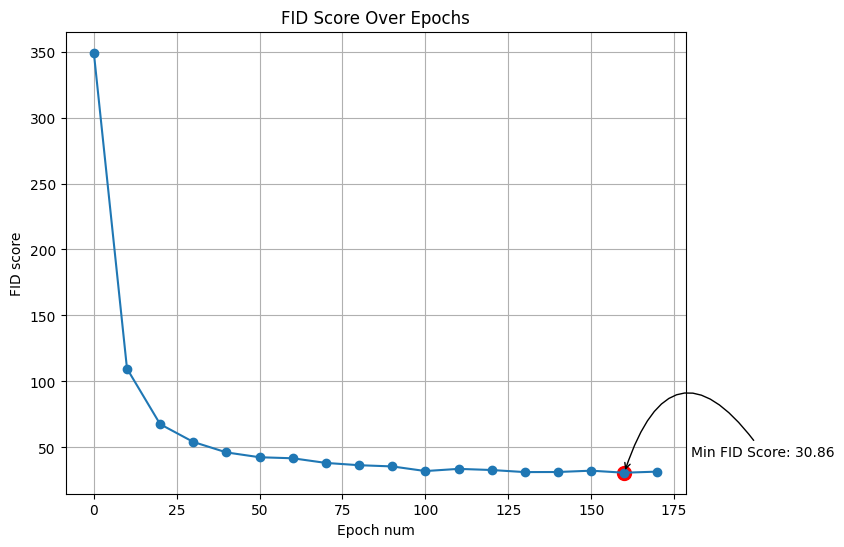

237/237 [==============================] - 49s 207ms/step - d_loss: -0.2525 - g_loss: -6.0731 - lr: 1.2977e-04
Epoch 172/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2495 - g_loss: -6.2279 - lr: 1.2977e-04
Epoch 173/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2926 - g_loss: -4.9065 - lr: 1.2976e-04
Epoch 174/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1886 - g_loss: -3.9563 - lr: 1.2976e-04
Epoch 175/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2311 - g_loss: -4.2241 - lr: 1.2976e-04
Epoch 176/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2700 - g_loss: -4.2256 - lr: 1.2976e-04
Epoch 177/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2432 - g_loss: -4.3091 - lr: 1.2976e-04
Epoch 178/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.2512 - g_loss: -4.8538 - lr: 1.2976e-04
Epoch 179/802


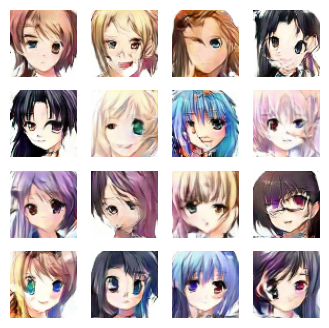

animeGenerated_wgan_180epochs


Output of the calculating FID command:
FID:  31.440531399025048

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314 ]


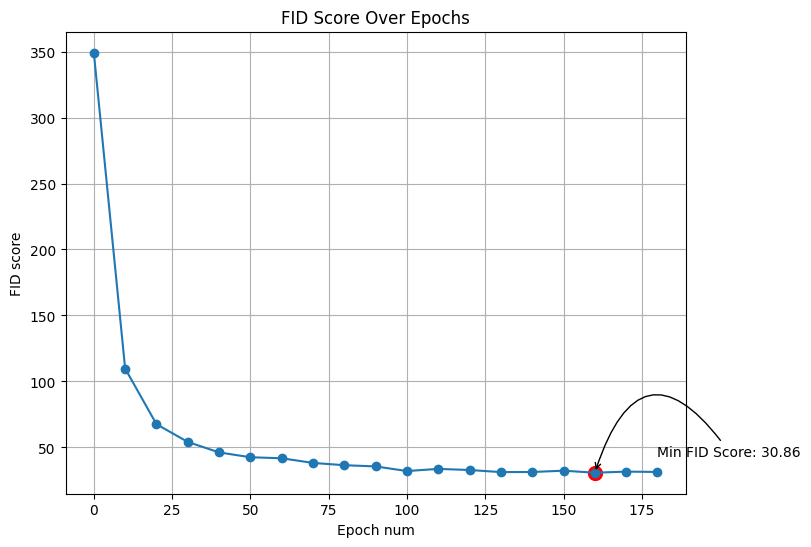

237/237 [==============================] - 49s 207ms/step - d_loss: -0.1845 - g_loss: -4.9446 - lr: 1.2975e-04
Epoch 182/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1971 - g_loss: -5.5843 - lr: 1.2975e-04
Epoch 183/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.2247 - g_loss: -6.0841 - lr: 1.2975e-04
Epoch 184/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1576 - g_loss: -6.1999 - lr: 1.2975e-04
Epoch 185/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.2143 - g_loss: -5.8953 - lr: 1.2975e-04
Epoch 186/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.2062 - g_loss: -6.0430 - lr: 1.2975e-04
Epoch 187/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1740 - g_loss: -5.6040 - lr: 1.2975e-04
Epoch 188/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1507 - g_loss: -5.9739 - lr: 1.2974e-04
Epoch 189/802


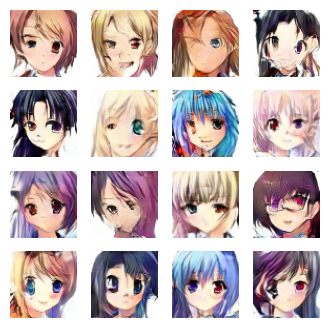

animeGenerated_wgan_190epochs


Output of the calculating FID command:
FID:  28.641833870754255

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387]


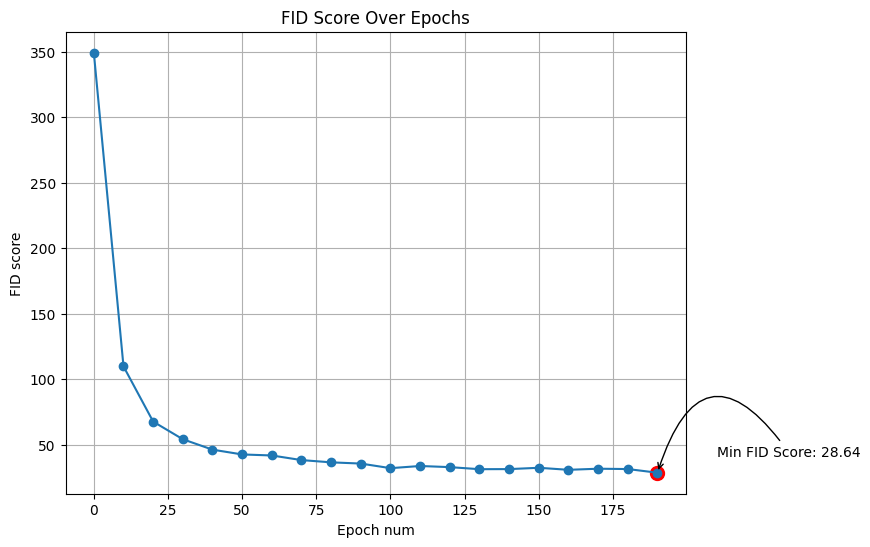

237/237 [==============================] - 50s 209ms/step - d_loss: -0.1392 - g_loss: -5.7504 - lr: 1.2974e-04
Epoch 192/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1435 - g_loss: -8.1224 - lr: 1.2974e-04
Epoch 193/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1281 - g_loss: -5.3033 - lr: 1.2974e-04
Epoch 194/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1579 - g_loss: -6.2608 - lr: 1.2974e-04
Epoch 195/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1365 - g_loss: -5.7864 - lr: 1.2973e-04
Epoch 196/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1261 - g_loss: -6.4720 - lr: 1.2973e-04
Epoch 197/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1182 - g_loss: -6.1957 - lr: 1.2973e-04
Epoch 198/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1398 - g_loss: -6.2049 - lr: 1.2973e-04
Epoch 199/802


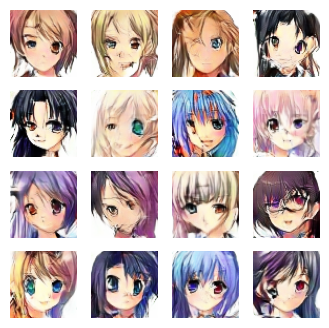

animeGenerated_wgan_200epochs


Output of the calculating FID command:
FID:  28.682006210154185

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621]


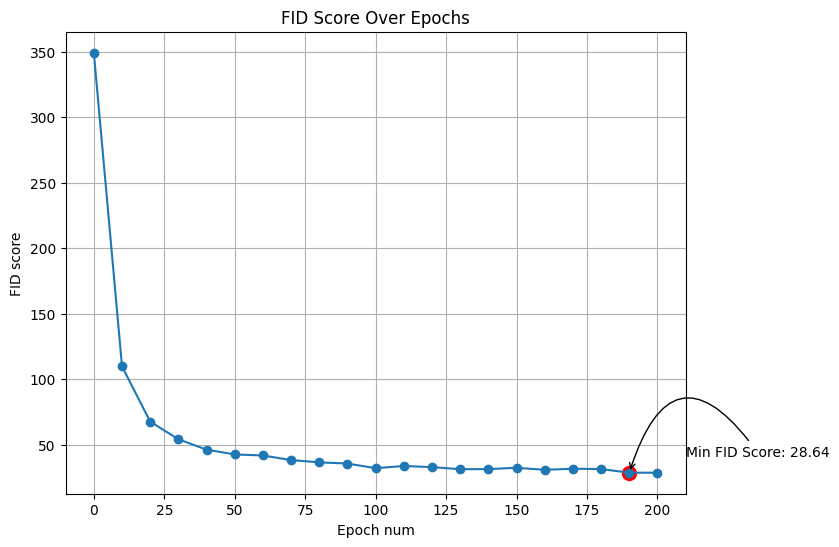

237/237 [==============================] - 49s 207ms/step - d_loss: -0.1131 - g_loss: -7.0764 - lr: 1.2973e-04
Epoch 202/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.1203 - g_loss: -7.4111 - lr: 1.2972e-04
Epoch 203/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0796 - g_loss: -7.8517 - lr: 1.2972e-04
Epoch 204/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0999 - g_loss: -7.6424 - lr: 1.2972e-04
Epoch 205/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0792 - g_loss: -8.4556 - lr: 1.2972e-04
Epoch 206/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.1024 - g_loss: -7.9227 - lr: 1.2972e-04
Epoch 207/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0916 - g_loss: -7.1873 - lr: 1.2972e-04
Epoch 208/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0633 - g_loss: -7.4994 - lr: 1.2972e-04
Epoch 209/802


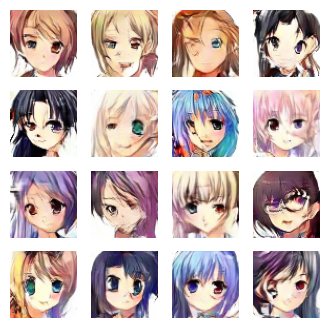

animeGenerated_wgan_210epochs


Output of the calculating FID command:
FID:  29.00889682983535

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683]


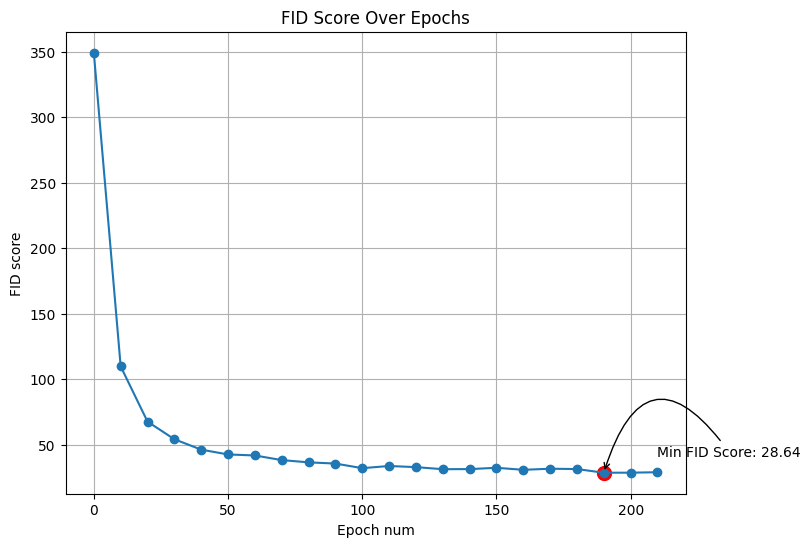

237/237 [==============================] - 49s 206ms/step - d_loss: -0.0902 - g_loss: -7.0342 - lr: 1.2971e-04
Epoch 212/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0769 - g_loss: -6.6630 - lr: 1.2971e-04
Epoch 213/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0753 - g_loss: -7.4011 - lr: 1.2971e-04
Epoch 214/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0617 - g_loss: -6.8768 - lr: 1.2971e-04
Epoch 215/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0453 - g_loss: -6.3893 - lr: 1.2971e-04
Epoch 216/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0275 - g_loss: -6.5494 - lr: 1.2971e-04
Epoch 217/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0449 - g_loss: -6.8537 - lr: 1.2970e-04
Epoch 218/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0204 - g_loss: -6.2353 - lr: 1.2970e-04
Epoch 219/802


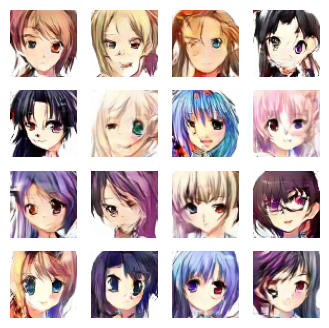

animeGenerated_wgan_220epochs


Output of the calculating FID command:
FID:  30.980858534018267

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853]


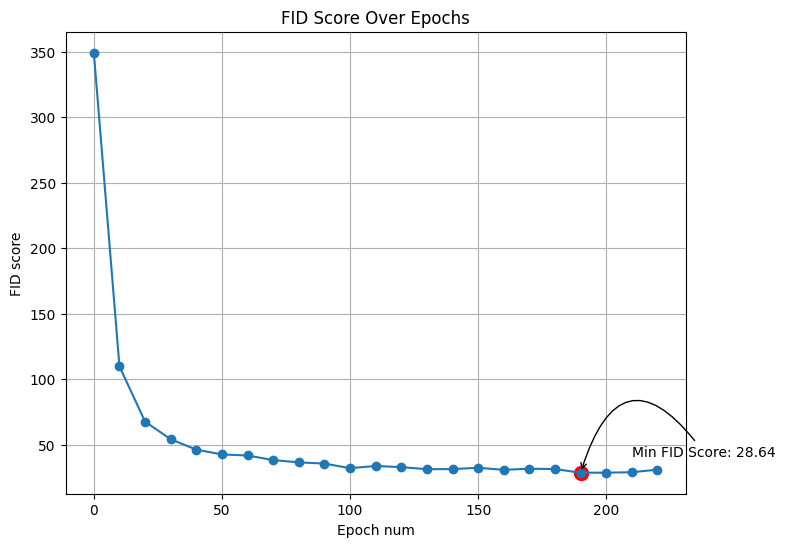

237/237 [==============================] - 49s 208ms/step - d_loss: -0.0434 - g_loss: -6.9283 - lr: 1.2970e-04
Epoch 222/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0273 - g_loss: -7.0477 - lr: 1.2970e-04
Epoch 223/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0400 - g_loss: -6.4739 - lr: 1.2970e-04
Epoch 224/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0319 - g_loss: -6.9471 - lr: 1.2969e-04
Epoch 225/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0515 - g_loss: -6.4589 - lr: 1.2969e-04
Epoch 226/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0158 - g_loss: -7.1127 - lr: 1.2969e-04
Epoch 227/802
237/237 [==============================] - 32s 137ms/step - d_loss: 8.5064e-05 - g_loss: -6.9628 - lr: 1.2969e-04
Epoch 228/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0099 - g_loss: -6.9023 - lr: 1.2969e-04
Epoch 229/8

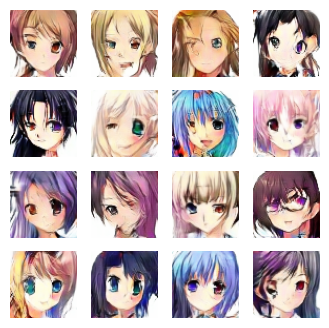

animeGenerated_wgan_230epochs


Output of the calculating FID command:
FID:  27.96433543617698

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544]


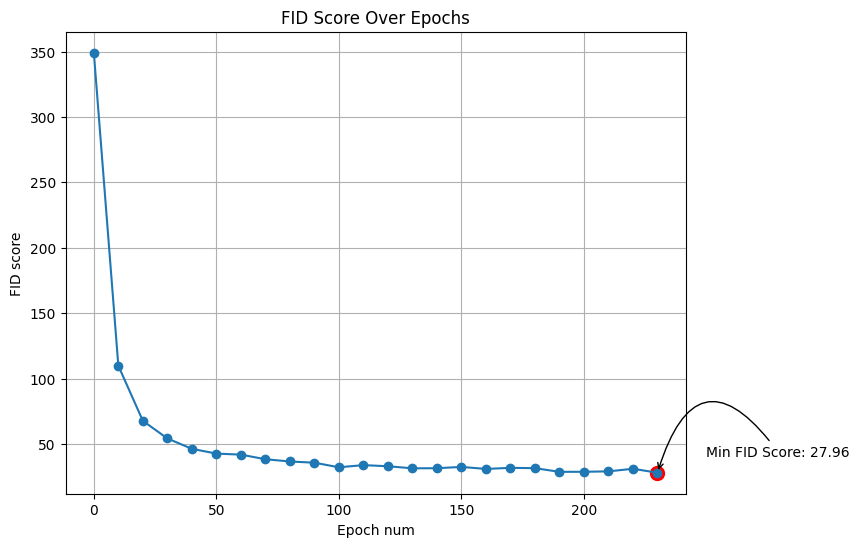

237/237 [==============================] - 50s 212ms/step - d_loss: 0.0211 - g_loss: -7.1970 - lr: 1.2969e-04
Epoch 232/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0186 - g_loss: -7.0051 - lr: 1.2968e-04
Epoch 233/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0329 - g_loss: -7.5569 - lr: 1.2968e-04
Epoch 234/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0124 - g_loss: -7.1384 - lr: 1.2968e-04
Epoch 235/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0075 - g_loss: -7.8947 - lr: 1.2968e-04
Epoch 236/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0053 - g_loss: -7.4634 - lr: 1.2968e-04
Epoch 237/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0048 - g_loss: -7.0929 - lr: 1.2968e-04
Epoch 238/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0252 - g_loss: -7.0381 - lr: 1.2968e-04
Epoch 239/802
237

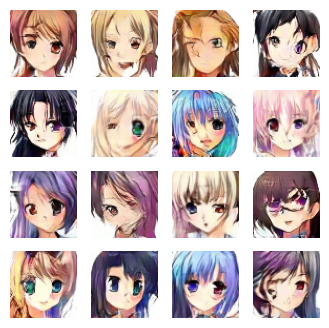

animeGenerated_wgan_240epochs


Output of the calculating FID command:
FID:  29.8192596660528

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967]


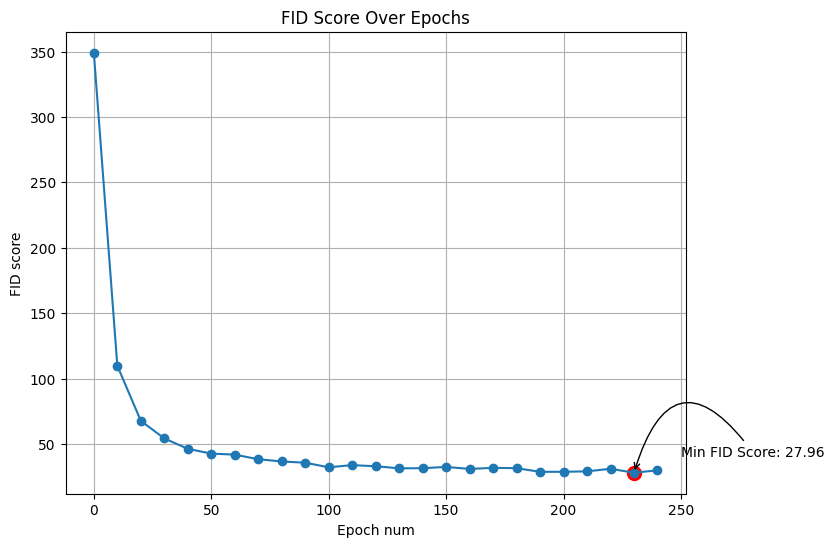

237/237 [==============================] - 50s 210ms/step - d_loss: 0.0052 - g_loss: -7.7544 - lr: 1.2967e-04
Epoch 242/802
237/237 [==============================] - 33s 137ms/step - d_loss: -0.0237 - g_loss: -7.6371 - lr: 1.2967e-04
Epoch 243/802
237/237 [==============================] - 32s 137ms/step - d_loss: -0.0042 - g_loss: -7.8195 - lr: 1.2967e-04
Epoch 244/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0172 - g_loss: -7.4461 - lr: 1.2967e-04
Epoch 245/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0181 - g_loss: -7.3089 - lr: 1.2967e-04
Epoch 246/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0165 - g_loss: -8.0979 - lr: 1.2966e-04
Epoch 247/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0300 - g_loss: -8.1636 - lr: 1.2966e-04
Epoch 248/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0219 - g_loss: -7.4462 - lr: 1.2966e-04
Epoch 249/802
237/23

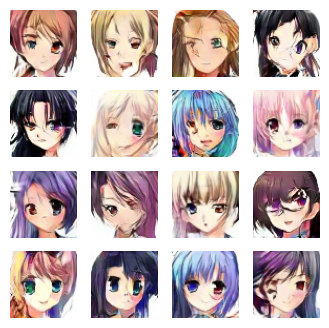

animeGenerated_wgan_250epochs


Output of the calculating FID command:
FID:  28.78182911247245

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967
  28.78182911]


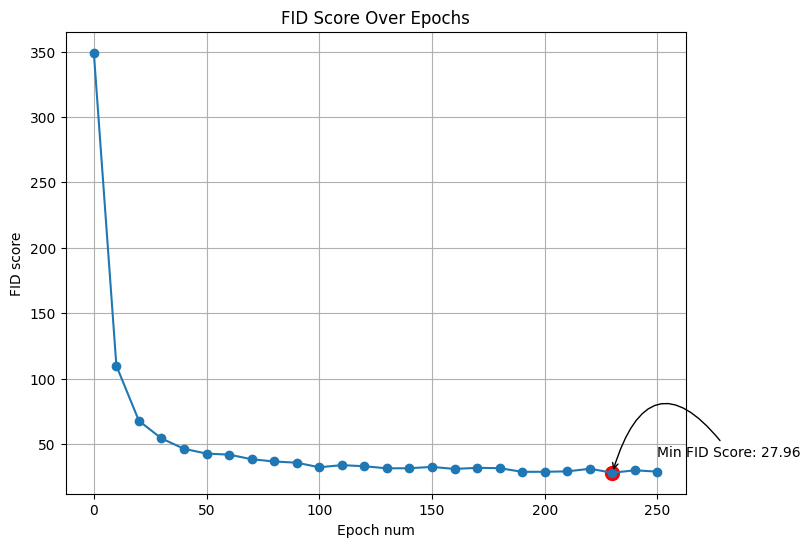

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0013 - g_loss: -7.3328 - lr: 1.2966e-04
Epoch 252/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0644 - g_loss: -8.0383 - lr: 1.2966e-04
Epoch 253/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0602 - g_loss: -7.3671 - lr: 1.2966e-04
Epoch 254/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0093 - g_loss: -7.0887 - lr: 1.2965e-04
Epoch 255/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0124 - g_loss: -7.3491 - lr: 1.2965e-04
Epoch 256/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0185 - g_loss: -7.6082 - lr: 1.2965e-04
Epoch 257/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0396 - g_loss: -8.2538 - lr: 1.2965e-04
Epoch 258/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0585 - g_loss: -7.9854 - lr: 1.2965e-04
Epoch 259/802
237/237 

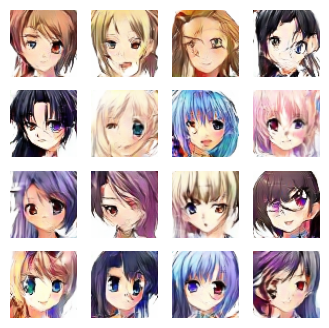

animeGenerated_wgan_260epochs


Output of the calculating FID command:
FID:  29.860347426739366

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967
  28.78182911  29.86034743]


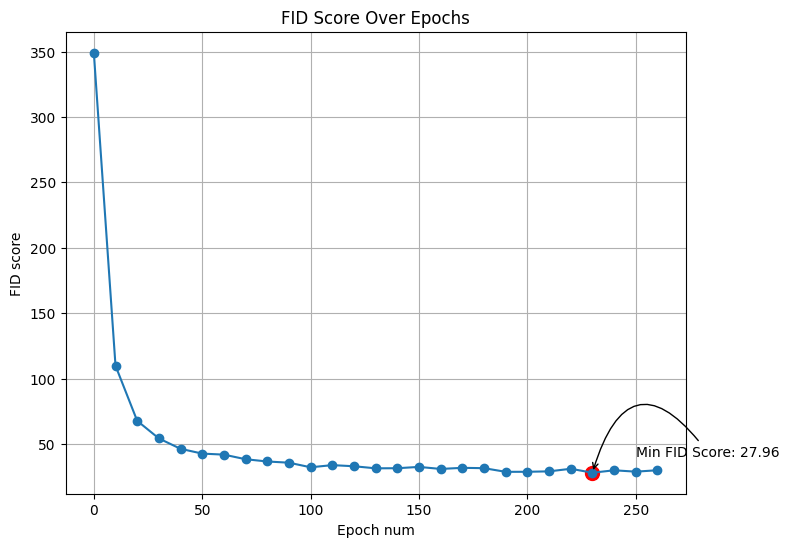

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0381 - g_loss: -7.2849 - lr: 1.2964e-04
Epoch 262/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0579 - g_loss: -7.5209 - lr: 1.2964e-04
Epoch 263/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0393 - g_loss: -7.8661 - lr: 1.2964e-04
Epoch 264/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0258 - g_loss: -6.9969 - lr: 1.2964e-04
Epoch 265/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0257 - g_loss: -7.6889 - lr: 1.2964e-04
Epoch 266/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0474 - g_loss: -7.6825 - lr: 1.2964e-04
Epoch 267/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0693 - g_loss: -8.0817 - lr: 1.2964e-04
Epoch 268/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0776 - g_loss: -7.8076 - lr: 1.2963e-04
Epoch 269/802
237/237 

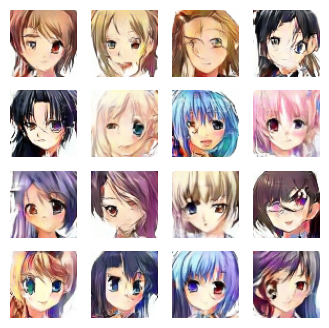

animeGenerated_wgan_270epochs


Output of the calculating FID command:
FID:  29.336004609841723

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967
  28.78182911  29.86034743  29.33600461]


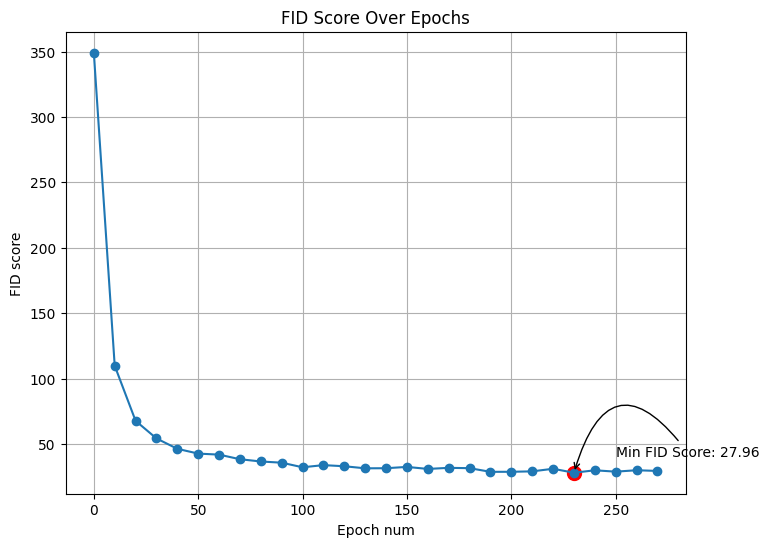

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0633 - g_loss: -7.2511 - lr: 1.2963e-04
Epoch 272/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0776 - g_loss: -7.4371 - lr: 1.2963e-04
Epoch 273/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0728 - g_loss: -7.2642 - lr: 1.2963e-04
Epoch 274/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0594 - g_loss: -7.5198 - lr: 1.2963e-04
Epoch 275/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0529 - g_loss: -7.6777 - lr: 1.2963e-04
Epoch 276/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0273 - g_loss: -7.5662 - lr: 1.2962e-04
Epoch 277/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0692 - g_loss: -7.2627 - lr: 1.2962e-04
Epoch 278/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0301 - g_loss: -7.2255 - lr: 1.2962e-04
Epoch 279/802
237/237 

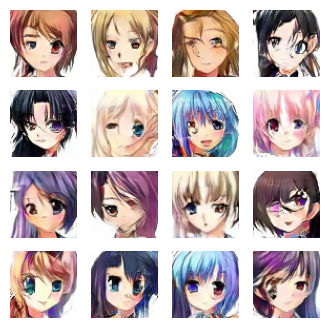

animeGenerated_wgan_280epochs


Output of the calculating FID command:
FID:  29.709822285667144

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967
  28.78182911  29.86034743 

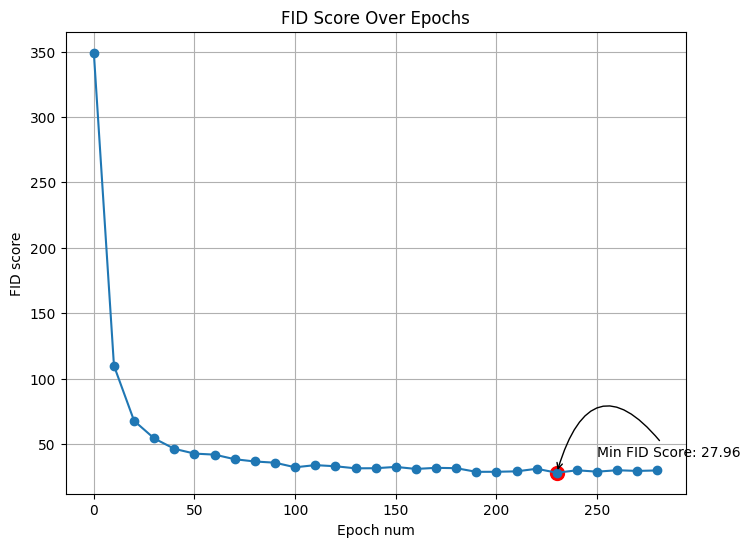

237/237 [==============================] - 50s 211ms/step - d_loss: 0.0817 - g_loss: -7.4919 - lr: 1.2962e-04
Epoch 282/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0767 - g_loss: -7.9573 - lr: 1.2962e-04
Epoch 283/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0771 - g_loss: -7.8582 - lr: 1.2961e-04
Epoch 284/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0692 - g_loss: -7.9578 - lr: 1.2961e-04
Epoch 285/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0803 - g_loss: -7.6755 - lr: 1.2961e-04
Epoch 286/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0299 - g_loss: -6.9912 - lr: 1.2961e-04
Epoch 287/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0838 - g_loss: -7.3333 - lr: 1.2961e-04
Epoch 288/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0754 - g_loss: -7.6488 - lr: 1.2961e-04
Epoch 289/802
237/237 

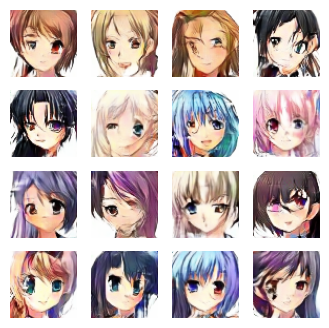

animeGenerated_wgan_290epochs


Output of the calculating FID command:
FID:  30.34694758000245

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  29.81925967
  28.7818

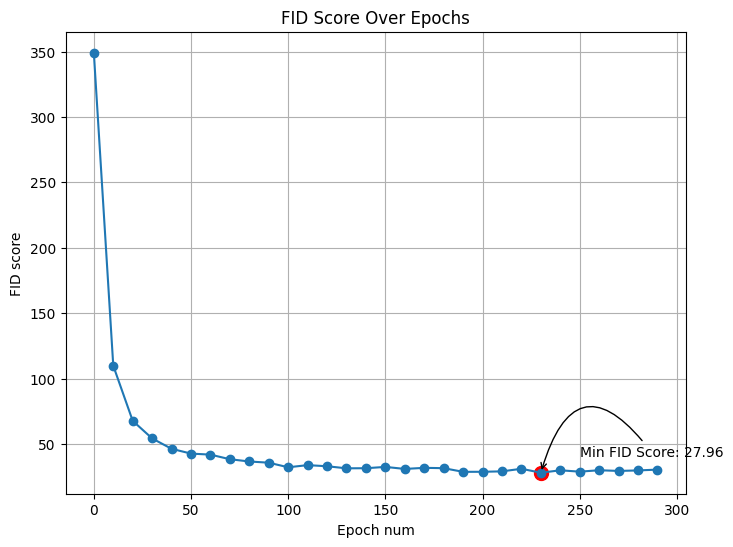

237/237 [==============================] - 50s 211ms/step - d_loss: 0.0633 - g_loss: -7.2044 - lr: 1.2960e-04
Epoch 292/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0880 - g_loss: -7.4700 - lr: 1.2960e-04
Epoch 293/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0552 - g_loss: -7.2668 - lr: 1.2960e-04
Epoch 294/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0817 - g_loss: -7.6231 - lr: 1.2960e-04
Epoch 295/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0608 - g_loss: -7.2205 - lr: 1.2960e-04
Epoch 296/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0676 - g_loss: -7.0954 - lr: 1.2960e-04
Epoch 297/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0476 - g_loss: -7.2886 - lr: 1.2960e-04
Epoch 298/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0559 - g_loss: -7.6025 - lr: 1.2959e-04
Epoch 299/802
237/237 

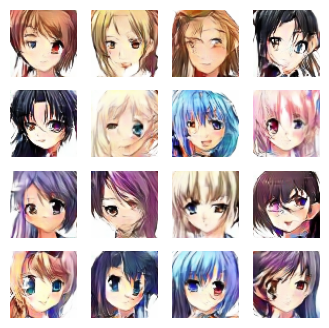

animeGenerated_wgan_300epochs


Output of the calculating FID command:
FID:  29.585864031830198

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085853  27.96433544  

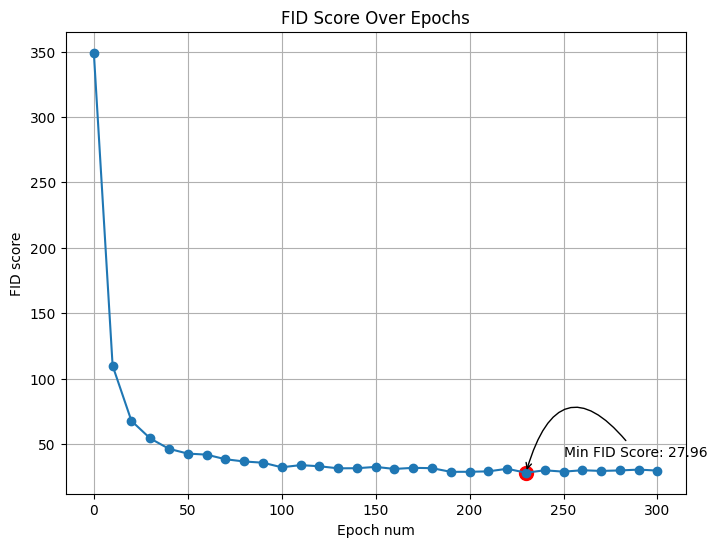

237/237 [==============================] - 49s 208ms/step - d_loss: 0.0717 - g_loss: -7.8042 - lr: 1.2959e-04
Epoch 302/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0847 - g_loss: -8.0574 - lr: 1.2959e-04
Epoch 303/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0524 - g_loss: -7.9319 - lr: 1.2959e-04
Epoch 304/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0640 - g_loss: -7.5339 - lr: 1.2959e-04
Epoch 305/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0634 - g_loss: -7.4212 - lr: 1.2958e-04
Epoch 306/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0821 - g_loss: -7.0299 - lr: 1.2958e-04
Epoch 307/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0964 - g_loss: -6.8391 - lr: 1.2958e-04
Epoch 308/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0672 - g_loss: -6.9579 - lr: 1.2958e-04
Epoch 309/802
237/237 

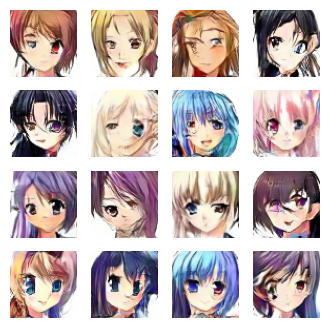

animeGenerated_wgan_310epochs


Output of the calculating FID command:
FID:  29.96241578338541

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  29.00889683  30.98085

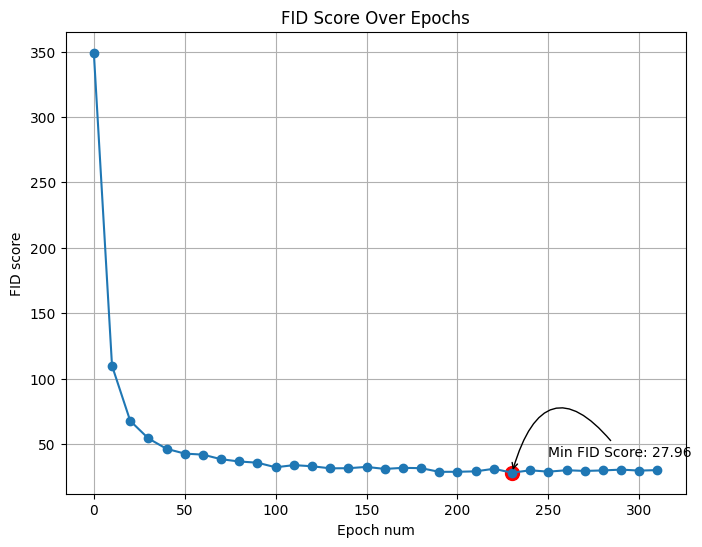

237/237 [==============================] - 49s 206ms/step - d_loss: 0.0809 - g_loss: -6.7903 - lr: 1.2958e-04
Epoch 312/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1039 - g_loss: -6.7731 - lr: 1.2957e-04
Epoch 313/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0914 - g_loss: -6.6420 - lr: 1.2957e-04
Epoch 314/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0683 - g_loss: -6.5286 - lr: 1.2957e-04
Epoch 315/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0897 - g_loss: -6.3982 - lr: 1.2957e-04
Epoch 316/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0895 - g_loss: -6.5072 - lr: 1.2957e-04
Epoch 317/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0665 - g_loss: -6.2737 - lr: 1.2957e-04
Epoch 318/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1022 - g_loss: -6.5587 - lr: 1.2957e-04
Epoch 319/802
237/237 

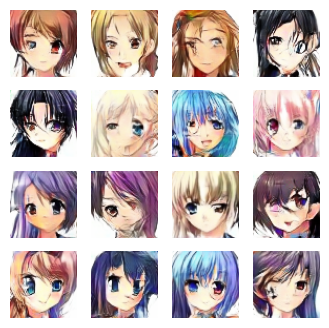

animeGenerated_wgan_320epochs


Output of the calculating FID command:
FID:  29.859312877207287

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.64183387
  28.68200621  

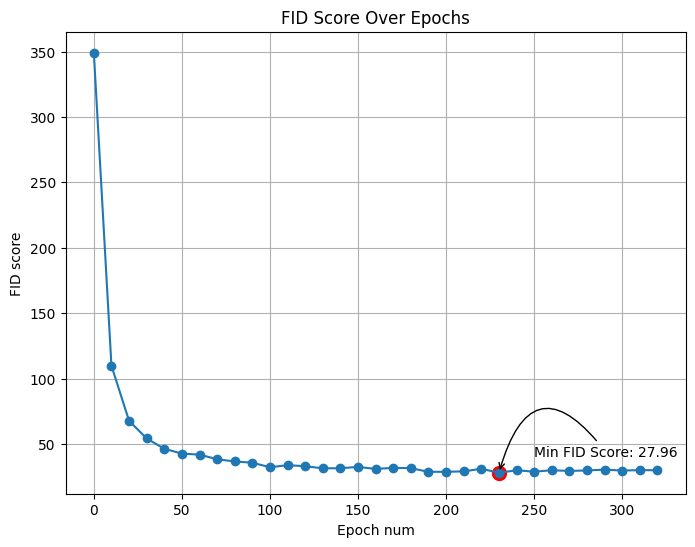

237/237 [==============================] - 49s 208ms/step - d_loss: 0.0608 - g_loss: -6.3283 - lr: 1.2956e-04
Epoch 322/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0594 - g_loss: -6.4247 - lr: 1.2956e-04
Epoch 323/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0976 - g_loss: -6.9094 - lr: 1.2956e-04
Epoch 324/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0802 - g_loss: -6.5833 - lr: 1.2956e-04
Epoch 325/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0935 - g_loss: -6.6994 - lr: 1.2956e-04
Epoch 326/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1048 - g_loss: -6.9605 - lr: 1.2956e-04
Epoch 327/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1071 - g_loss: -6.7833 - lr: 1.2955e-04
Epoch 328/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1187 - g_loss: -6.3046 - lr: 1.2955e-04
Epoch 329/802
237/237 

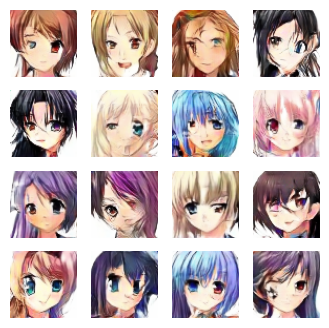

animeGenerated_wgan_330epochs


Output of the calculating FID command:
FID:  30.43232266573284

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  31.4405314   28.641833

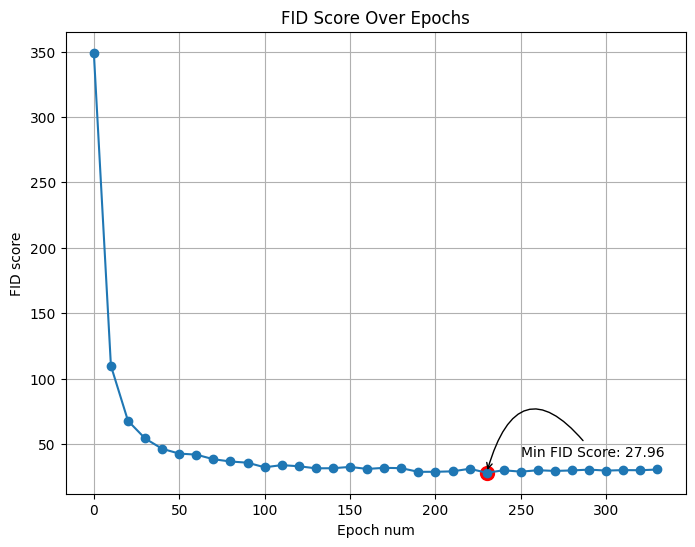

237/237 [==============================] - 50s 210ms/step - d_loss: 0.1082 - g_loss: -7.4430 - lr: 1.2955e-04
Epoch 332/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1296 - g_loss: -7.0250 - lr: 1.2955e-04
Epoch 333/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0982 - g_loss: -6.6197 - lr: 1.2955e-04
Epoch 334/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1206 - g_loss: -6.7983 - lr: 1.2954e-04
Epoch 335/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1049 - g_loss: -6.9247 - lr: 1.2954e-04
Epoch 336/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1184 - g_loss: -7.1078 - lr: 1.2954e-04
Epoch 337/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0931 - g_loss: -7.2656 - lr: 1.2954e-04
Epoch 338/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1234 - g_loss: -6.3820 - lr: 1.2954e-04
Epoch 339/802
237/237 

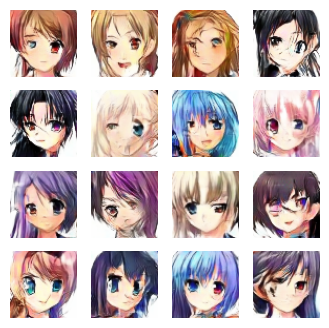

animeGenerated_wgan_340epochs


Output of the calculating FID command:
FID:  29.800333600619638

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.85860767  31.70094684  3

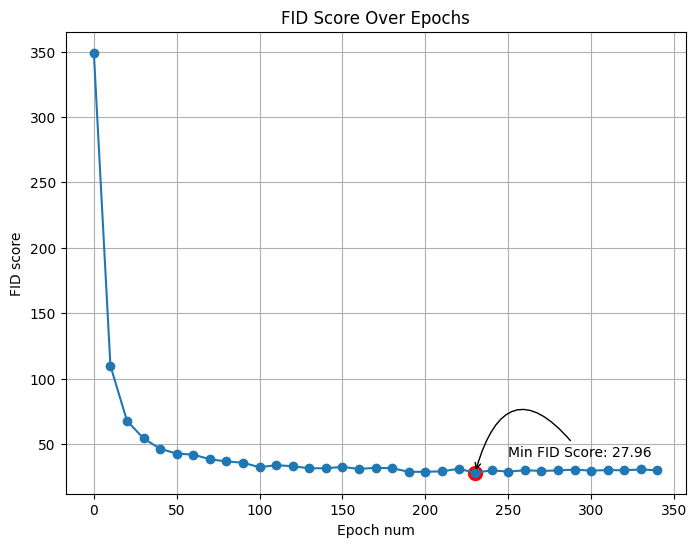

237/237 [==============================] - 50s 212ms/step - d_loss: 0.1014 - g_loss: -6.6498 - lr: 1.2954e-04
Epoch 342/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0962 - g_loss: -6.8133 - lr: 1.2953e-04
Epoch 343/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1308 - g_loss: -6.6243 - lr: 1.2953e-04
Epoch 344/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0981 - g_loss: -6.0570 - lr: 1.2953e-04
Epoch 345/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0788 - g_loss: -6.3065 - lr: 1.2953e-04
Epoch 346/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1362 - g_loss: -6.2585 - lr: 1.2953e-04
Epoch 347/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0679 - g_loss: -6.0004 - lr: 1.2953e-04
Epoch 348/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1227 - g_loss: -6.5573 - lr: 1.2953e-04
Epoch 349/802
237/237 

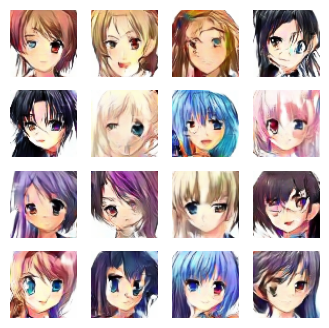

animeGenerated_wgan_350epochs


Output of the calculating FID command:
FID:  29.524602831801303

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  32.40944126  30.8586

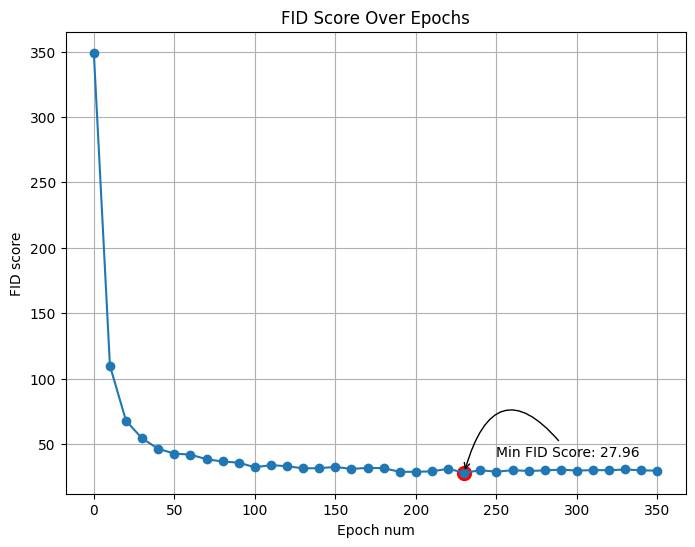

237/237 [==============================] - 49s 207ms/step - d_loss: 0.1138 - g_loss: -6.0128 - lr: 1.2952e-04
Epoch 352/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0874 - g_loss: -6.2884 - lr: 1.2952e-04
Epoch 353/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1315 - g_loss: -6.3993 - lr: 1.2952e-04
Epoch 354/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0890 - g_loss: -6.2405 - lr: 1.2952e-04
Epoch 355/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0945 - g_loss: -6.0772 - lr: 1.2952e-04
Epoch 356/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1098 - g_loss: -5.9246 - lr: 1.2951e-04
Epoch 357/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0756 - g_loss: -6.0620 - lr: 1.2951e-04
Epoch 358/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1227 - g_loss: -6.0446 - lr: 1.2951e-04
Epoch 359/802
237/237 

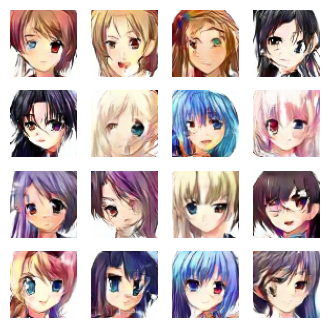

animeGenerated_wgan_360epochs


Output of the calculating FID command:
FID:  31.014105496279115

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.33319384  31.40649357
  

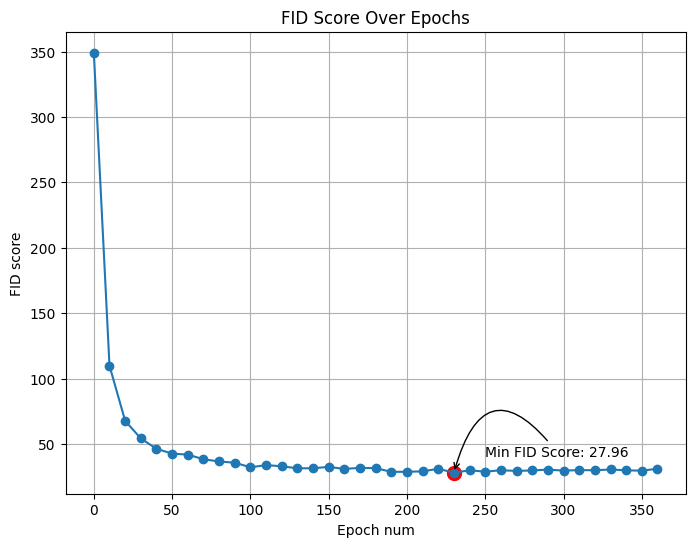

237/237 [==============================] - 49s 208ms/step - d_loss: 0.1193 - g_loss: -6.4696 - lr: 1.2951e-04
Epoch 362/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1288 - g_loss: -6.1974 - lr: 1.2951e-04
Epoch 363/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1019 - g_loss: -6.2582 - lr: 1.2951e-04
Epoch 364/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1114 - g_loss: -6.2007 - lr: 1.2950e-04
Epoch 365/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0700 - g_loss: -6.1624 - lr: 1.2950e-04
Epoch 366/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0943 - g_loss: -6.0622 - lr: 1.2950e-04
Epoch 367/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0879 - g_loss: -6.2768 - lr: 1.2950e-04
Epoch 368/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0911 - g_loss: -6.0205 - lr: 1.2950e-04
Epoch 369/802
237/237 

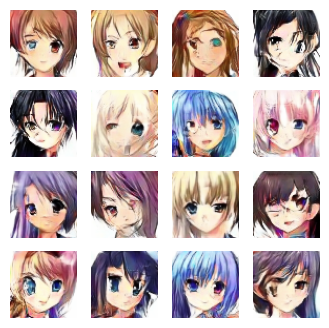

animeGenerated_wgan_370epochs


Output of the calculating FID command:
FID:  31.942959063763794

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   32.91010087  31.3331

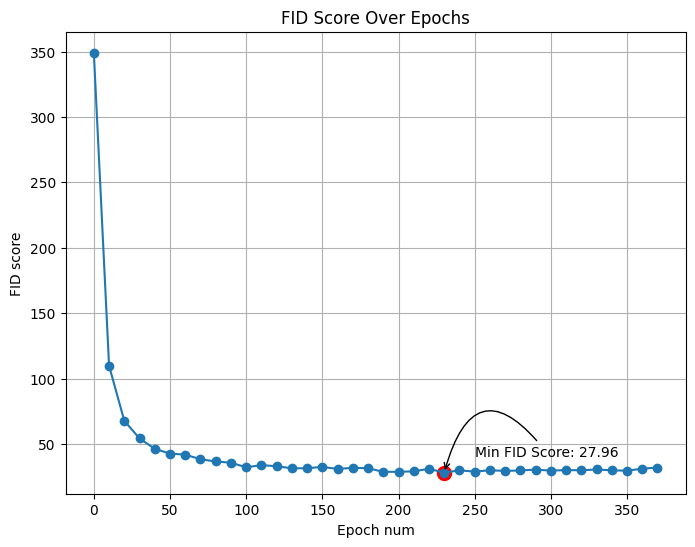

237/237 [==============================] - 49s 208ms/step - d_loss: 0.1006 - g_loss: -5.7900 - lr: 1.2949e-04
Epoch 372/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1111 - g_loss: -6.0610 - lr: 1.2949e-04
Epoch 373/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1334 - g_loss: -6.1361 - lr: 1.2949e-04
Epoch 374/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1176 - g_loss: -6.2295 - lr: 1.2949e-04
Epoch 375/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1081 - g_loss: -5.9659 - lr: 1.2949e-04
Epoch 376/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1211 - g_loss: -5.9725 - lr: 1.2949e-04
Epoch 377/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0852 - g_loss: -6.1294 - lr: 1.2949e-04
Epoch 378/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1117 - g_loss: -6.0841 - lr: 1.2948e-04
Epoch 379/802
237/237 

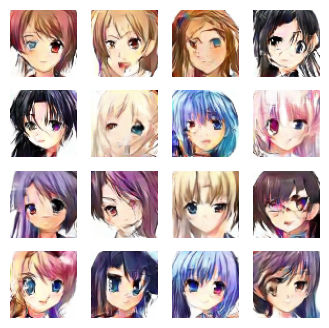

animeGenerated_wgan_380epochs


Output of the calculating FID command:
FID:  32.351914074984734

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131456  33.7715299   

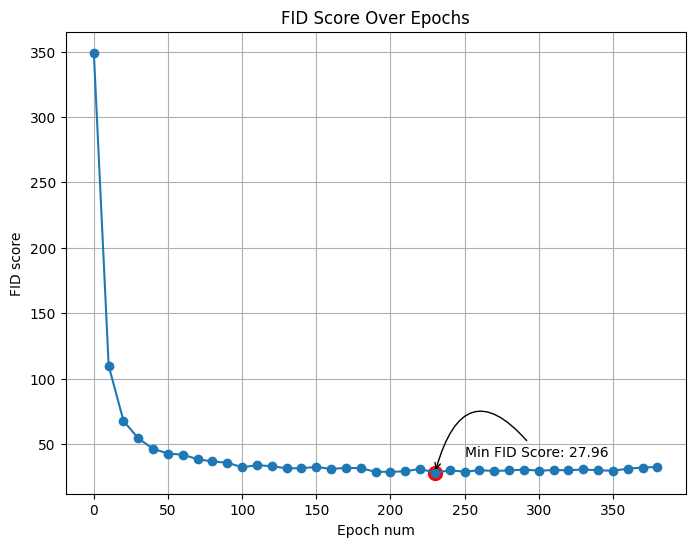

237/237 [==============================] - 50s 211ms/step - d_loss: 0.1182 - g_loss: -5.6917 - lr: 1.2948e-04
Epoch 382/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1178 - g_loss: -5.8768 - lr: 1.2948e-04
Epoch 383/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1011 - g_loss: -5.9256 - lr: 1.2948e-04
Epoch 384/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1232 - g_loss: -5.8456 - lr: 1.2948e-04
Epoch 385/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0712 - g_loss: -5.6491 - lr: 1.2948e-04
Epoch 386/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1169 - g_loss: -5.6712 - lr: 1.2947e-04
Epoch 387/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0953 - g_loss: -5.6711 - lr: 1.2947e-04
Epoch 388/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1012 - g_loss: -5.4837 - lr: 1.2947e-04
Epoch 389/802
237/237 

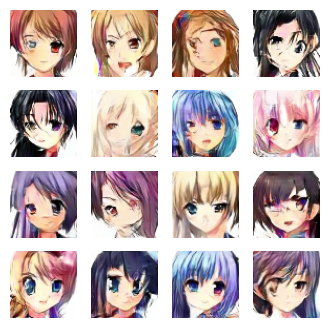

animeGenerated_wgan_390epochs


Output of the calculating FID command:
FID:  31.69444619245934

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35.6296679
  32.12131

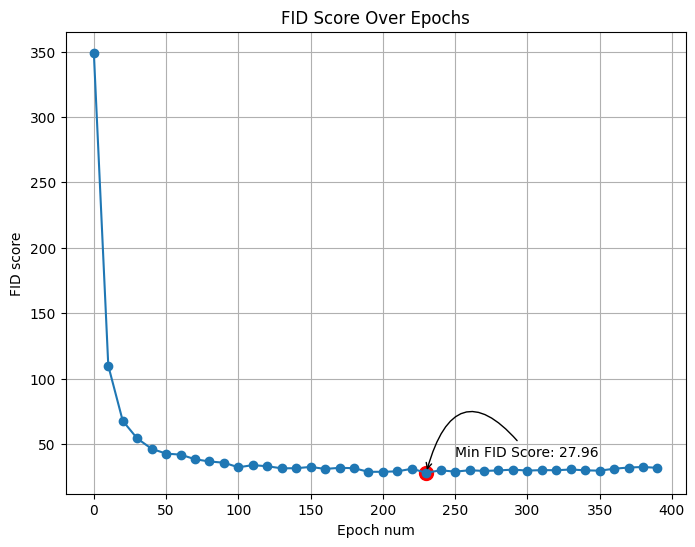

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0749 - g_loss: -5.4560 - lr: 1.2947e-04
Epoch 392/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0606 - g_loss: -5.4527 - lr: 1.2947e-04
Epoch 393/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0934 - g_loss: -5.4524 - lr: 1.2946e-04
Epoch 394/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0907 - g_loss: -5.4141 - lr: 1.2946e-04
Epoch 395/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0955 - g_loss: -5.4581 - lr: 1.2946e-04
Epoch 396/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0983 - g_loss: -5.5032 - lr: 1.2946e-04
Epoch 397/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1115 - g_loss: -5.5606 - lr: 1.2946e-04
Epoch 398/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0829 - g_loss: -5.6573 - lr: 1.2946e-04
Epoch 399/802
237/237 

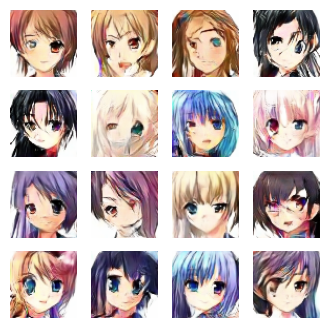

animeGenerated_wgan_400epochs


Output of the calculating FID command:
FID:  33.78157933834751

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.28413983  36.55267256  35

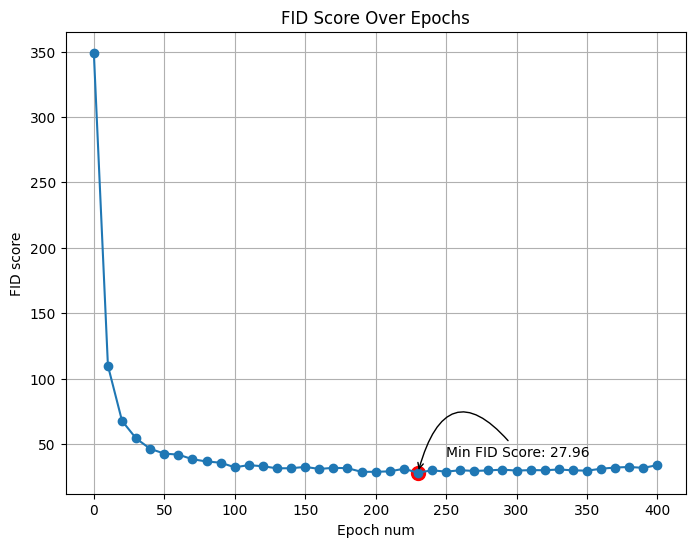

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0765 - g_loss: -5.7180 - lr: 1.2945e-04
Epoch 402/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0846 - g_loss: -5.6336 - lr: 1.2945e-04
Epoch 403/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0868 - g_loss: -5.7162 - lr: 1.2945e-04
Epoch 404/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0846 - g_loss: -5.7760 - lr: 1.2945e-04
Epoch 405/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1158 - g_loss: -5.7473 - lr: 1.2945e-04
Epoch 406/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0864 - g_loss: -5.8037 - lr: 1.2945e-04
Epoch 407/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0736 - g_loss: -5.6690 - lr: 1.2945e-04
Epoch 408/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1054 - g_loss: -5.5256 - lr: 1.2944e-04
Epoch 409/802
237/237 

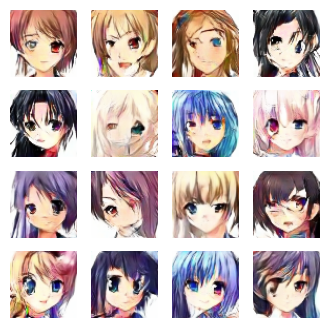

animeGenerated_wgan_410epochs


Output of the calculating FID command:
FID:  36.261314477338146

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41.7998343   38.2841

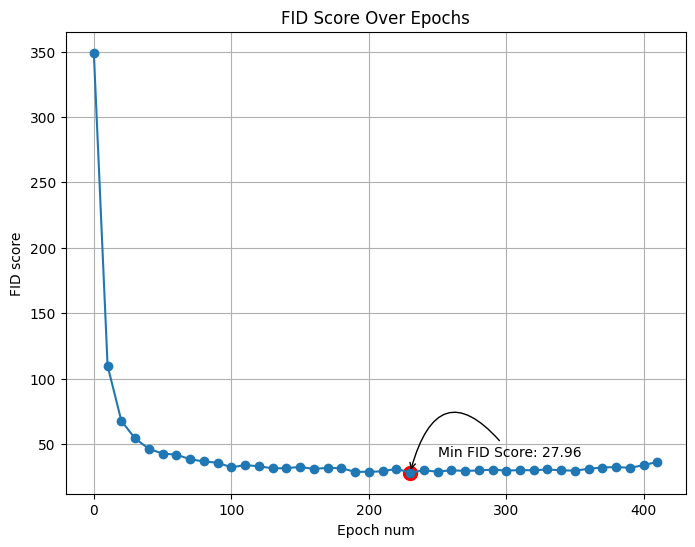

237/237 [==============================] - 49s 208ms/step - d_loss: 0.1203 - g_loss: -5.6121 - lr: 1.2944e-04
Epoch 412/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0765 - g_loss: -5.6077 - lr: 1.2944e-04
Epoch 413/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1054 - g_loss: -5.4996 - lr: 1.2944e-04
Epoch 414/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1052 - g_loss: -5.5544 - lr: 1.2944e-04
Epoch 415/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1226 - g_loss: -5.5901 - lr: 1.2943e-04
Epoch 416/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0795 - g_loss: -5.5988 - lr: 1.2943e-04
Epoch 417/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0713 - g_loss: -5.5879 - lr: 1.2943e-04
Epoch 418/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1116 - g_loss: -5.5632 - lr: 1.2943e-04
Epoch 419/802
237/237 

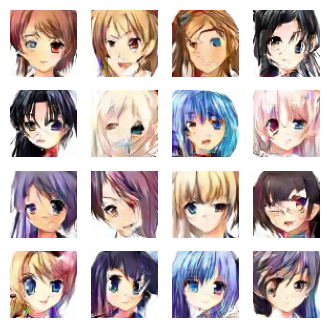

animeGenerated_wgan_420epochs


Output of the calculating FID command:
FID:  34.24421383273548

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983
  42.58554579  41

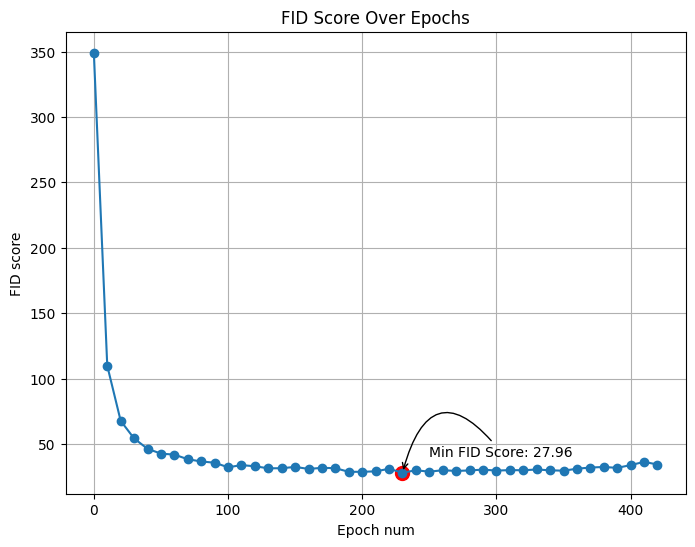

237/237 [==============================] - 51s 213ms/step - d_loss: 0.0516 - g_loss: -5.4203 - lr: 1.2943e-04
Epoch 422/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0917 - g_loss: -5.3606 - lr: 1.2942e-04
Epoch 423/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1013 - g_loss: -5.4799 - lr: 1.2942e-04
Epoch 424/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1062 - g_loss: -5.6457 - lr: 1.2942e-04
Epoch 425/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0985 - g_loss: -5.7391 - lr: 1.2942e-04
Epoch 426/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0707 - g_loss: -5.7018 - lr: 1.2942e-04
Epoch 427/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0978 - g_loss: -5.6925 - lr: 1.2942e-04
Epoch 428/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1371 - g_loss: -5.7876 - lr: 1.2942e-04
Epoch 429/802
237/237 

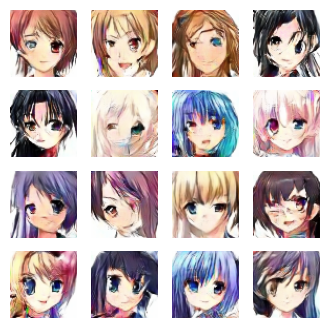

animeGenerated_wgan_430epochs


Output of the calculating FID command:
FID:  34.5473079972127

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127]
[349.09119951 109.76413077  67.63711724  54.17792023  46.24512983


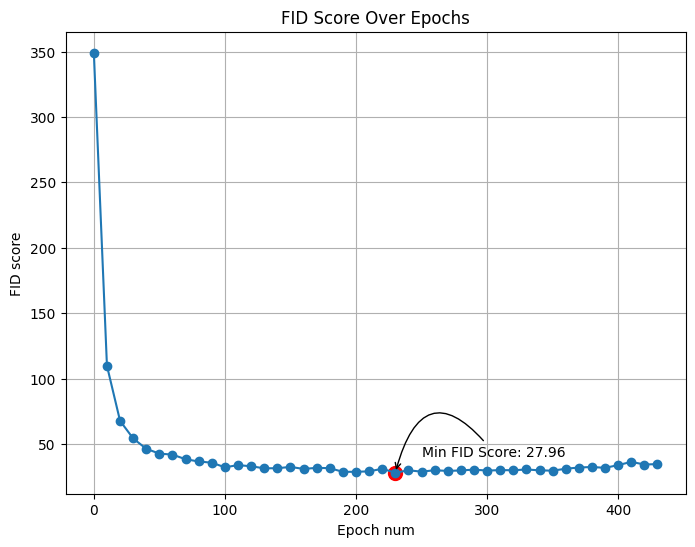

237/237 [==============================] - 49s 207ms/step - d_loss: 0.0798 - g_loss: -5.5634 - lr: 1.2941e-04
Epoch 432/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0913 - g_loss: -5.6296 - lr: 1.2941e-04
Epoch 433/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0452 - g_loss: -5.7310 - lr: 1.2941e-04
Epoch 434/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1019 - g_loss: -5.5779 - lr: 1.2941e-04
Epoch 435/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0922 - g_loss: -5.5553 - lr: 1.2941e-04
Epoch 436/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1020 - g_loss: -5.4498 - lr: 1.2941e-04
Epoch 437/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0970 - g_loss: -5.4224 - lr: 1.2940e-04
Epoch 438/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0982 - g_loss: -5.3003 - lr: 1.2940e-04
Epoch 439/802
237/237 

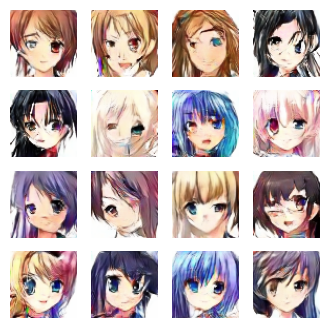

animeGenerated_wgan_440epochs


Output of the calculating FID command:
FID:  35.146585551397436

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436]
[349.09119951 109.76413077  67.63711724  54.

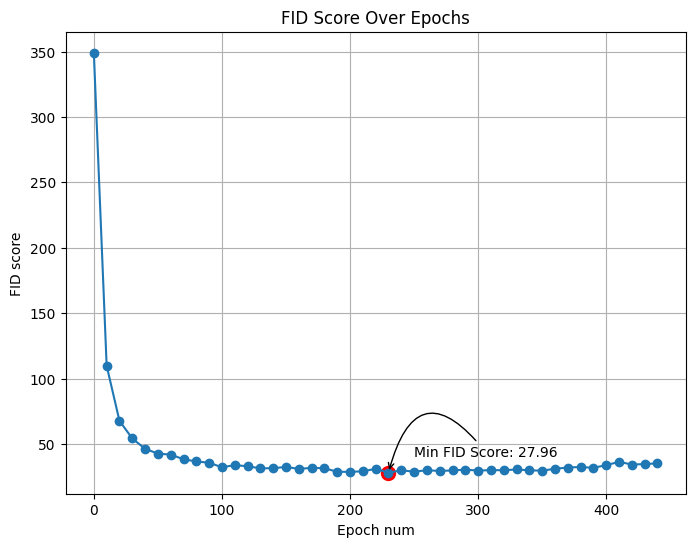

237/237 [==============================] - 49s 206ms/step - d_loss: 0.1110 - g_loss: -5.2601 - lr: 1.2940e-04
Epoch 442/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0606 - g_loss: -5.2299 - lr: 1.2940e-04
Epoch 443/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0992 - g_loss: -5.2048 - lr: 1.2940e-04
Epoch 444/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0775 - g_loss: -5.1592 - lr: 1.2939e-04
Epoch 445/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1022 - g_loss: -5.2455 - lr: 1.2939e-04
Epoch 446/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0736 - g_loss: -5.1916 - lr: 1.2939e-04
Epoch 447/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0508 - g_loss: -5.1756 - lr: 1.2939e-04
Epoch 448/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0758 - g_loss: -5.1555 - lr: 1.2939e-04
Epoch 449/802
237/237 

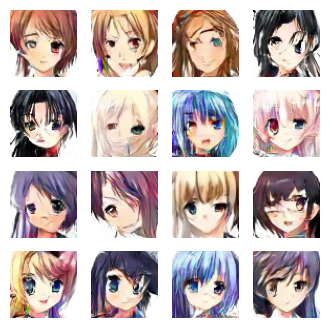

animeGenerated_wgan_450epochs


Output of the calculating FID command:
FID:  36.76944078013702

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702]
[349.09119951 109.76413077

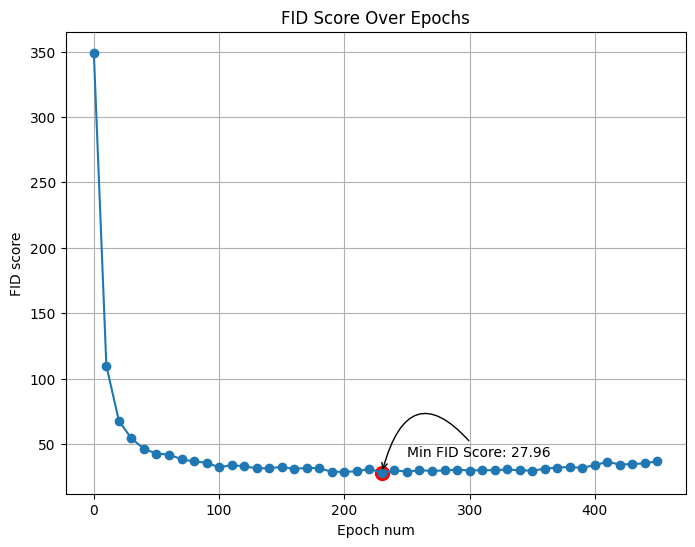

237/237 [==============================] - 50s 213ms/step - d_loss: 0.0960 - g_loss: -5.5162 - lr: 1.2939e-04
Epoch 452/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0771 - g_loss: -5.4947 - lr: 1.2938e-04
Epoch 453/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1092 - g_loss: -5.4856 - lr: 1.2938e-04
Epoch 454/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1010 - g_loss: -5.3864 - lr: 1.2938e-04
Epoch 455/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1531 - g_loss: -5.2997 - lr: 1.2938e-04
Epoch 456/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0913 - g_loss: -5.2877 - lr: 1.2938e-04
Epoch 457/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0959 - g_loss: -5.4210 - lr: 1.2938e-04
Epoch 458/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1068 - g_loss: -5.4090 - lr: 1.2938e-04
Epoch 459/802
237/237 

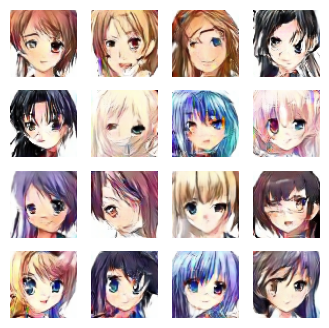

animeGenerated_wgan_460epochs


Output of the calculating FID command:
FID:  36.94539401764541

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541]
[349.09

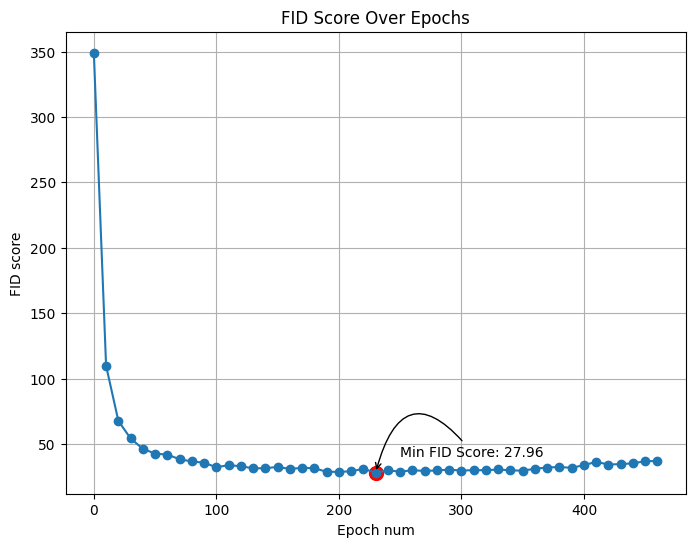

237/237 [==============================] - 49s 207ms/step - d_loss: 0.1171 - g_loss: -5.4339 - lr: 1.2937e-04
Epoch 462/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0959 - g_loss: -5.4393 - lr: 1.2937e-04
Epoch 463/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0746 - g_loss: -5.4109 - lr: 1.2937e-04
Epoch 464/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0723 - g_loss: -5.3832 - lr: 1.2937e-04
Epoch 465/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0706 - g_loss: -5.3892 - lr: 1.2937e-04
Epoch 466/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1064 - g_loss: -5.4305 - lr: 1.2936e-04
Epoch 467/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0553 - g_loss: -5.5357 - lr: 1.2936e-04
Epoch 468/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0919 - g_loss: -5.5011 - lr: 1.2936e-04
Epoch 469/802
237/237 

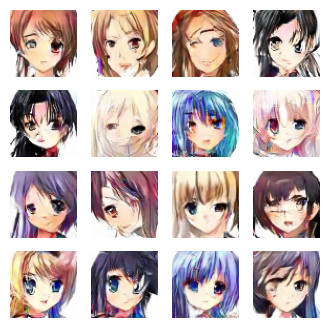

animeGenerated_wgan_470epochs


Output of the calculating FID command:
FID:  37.061456149572734

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

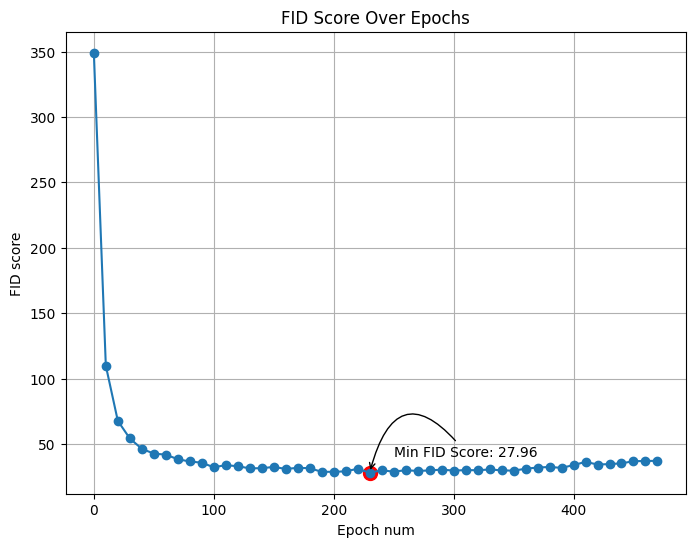

237/237 [==============================] - 49s 207ms/step - d_loss: 0.1105 - g_loss: -5.3441 - lr: 1.2936e-04
Epoch 472/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0979 - g_loss: -5.3864 - lr: 1.2936e-04
Epoch 473/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0801 - g_loss: -5.3454 - lr: 1.2936e-04
Epoch 474/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0794 - g_loss: -5.2989 - lr: 1.2935e-04
Epoch 475/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0526 - g_loss: -5.3474 - lr: 1.2935e-04
Epoch 476/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1077 - g_loss: -5.3586 - lr: 1.2935e-04
Epoch 477/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1079 - g_loss: -5.3106 - lr: 1.2935e-04
Epoch 478/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1099 - g_loss: -5.2726 - lr: 1.2935e-04
Epoch 479/802
237/237 

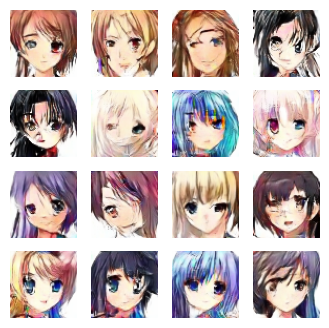

animeGenerated_wgan_480epochs


Output of the calculating FID command:
FID:  38.1676970902912

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.06145

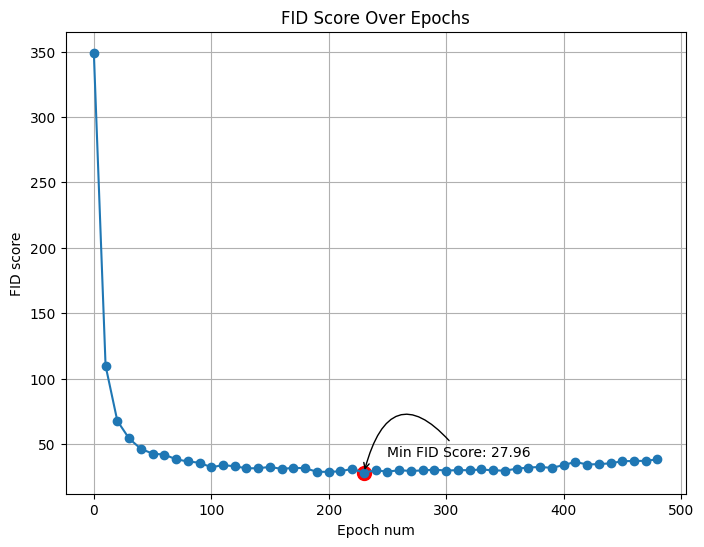

237/237 [==============================] - 50s 210ms/step - d_loss: 0.0682 - g_loss: -5.2684 - lr: 1.2934e-04
Epoch 482/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0700 - g_loss: -5.2170 - lr: 1.2934e-04
Epoch 483/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0840 - g_loss: -5.2811 - lr: 1.2934e-04
Epoch 484/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0817 - g_loss: -5.2625 - lr: 1.2934e-04
Epoch 485/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0712 - g_loss: -5.3003 - lr: 1.2934e-04
Epoch 486/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1143 - g_loss: -5.2031 - lr: 1.2934e-04
Epoch 487/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0637 - g_loss: -5.2472 - lr: 1.2934e-04
Epoch 488/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.1294 - g_loss: -5.3221 - lr: 1.2933e-04
Epoch 489/802
237/237 

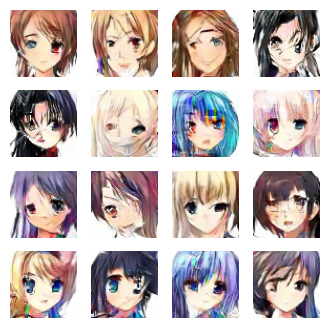

animeGenerated_wgan_490epochs


Output of the calculating FID command:
FID:  37.414950403061084

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

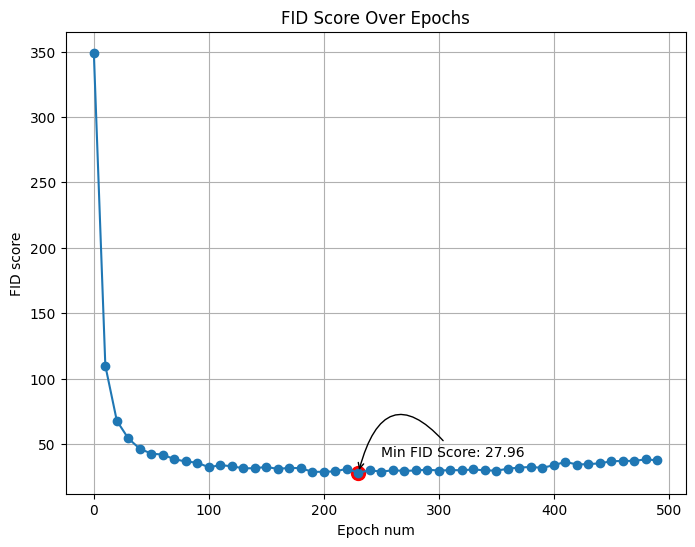

237/237 [==============================] - 49s 209ms/step - d_loss: 0.1054 - g_loss: -5.2422 - lr: 1.2933e-04
Epoch 492/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0774 - g_loss: -5.2025 - lr: 1.2933e-04
Epoch 493/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0860 - g_loss: -5.1786 - lr: 1.2933e-04
Epoch 494/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0869 - g_loss: -5.2135 - lr: 1.2933e-04
Epoch 495/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0705 - g_loss: -5.1979 - lr: 1.2933e-04
Epoch 496/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0765 - g_loss: -5.1818 - lr: 1.2932e-04
Epoch 497/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0614 - g_loss: -5.1962 - lr: 1.2932e-04
Epoch 498/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1057 - g_loss: -5.1967 - lr: 1.2932e-04
Epoch 499/802
237/237 

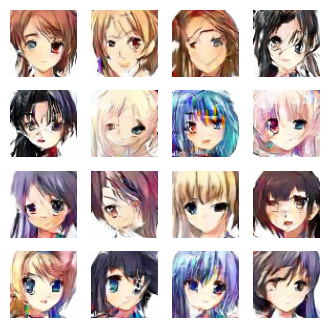

animeGenerated_wgan_500epochs


Output of the calculating FID command:
FID:  38.48706128676423

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.0614

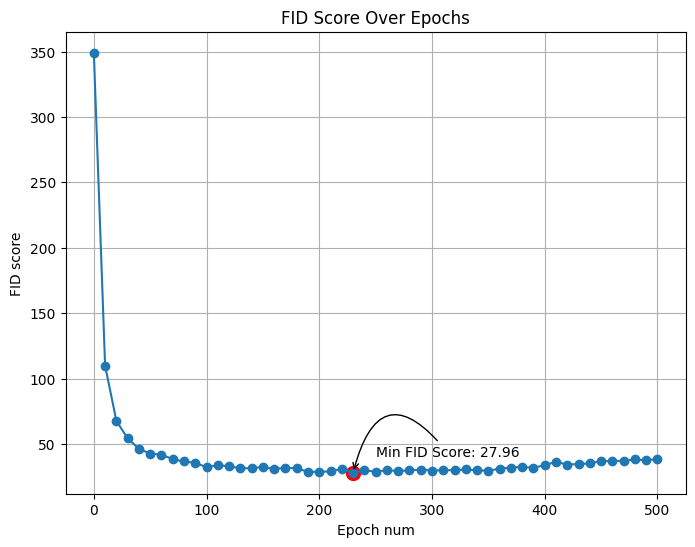

237/237 [==============================] - 49s 207ms/step - d_loss: 0.1037 - g_loss: -5.1806 - lr: 1.2932e-04
Epoch 502/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0781 - g_loss: -5.1660 - lr: 1.2932e-04
Epoch 503/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1302 - g_loss: -5.1631 - lr: 1.2931e-04
Epoch 504/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0796 - g_loss: -5.1404 - lr: 1.2931e-04
Epoch 505/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0679 - g_loss: -5.1626 - lr: 1.2931e-04
Epoch 506/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0819 - g_loss: -5.1539 - lr: 1.2931e-04
Epoch 507/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0678 - g_loss: -5.0728 - lr: 1.2931e-04
Epoch 508/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0642 - g_loss: -5.0770 - lr: 1.2931e-04
Epoch 509/802
237/237 

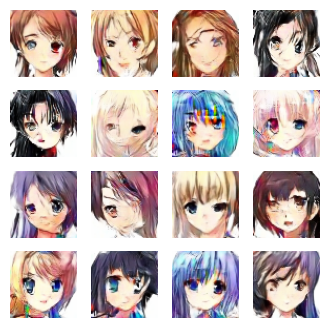

animeGenerated_wgan_510epochs


Output of the calculating FID command:
FID:  37.83501843327488

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.0614

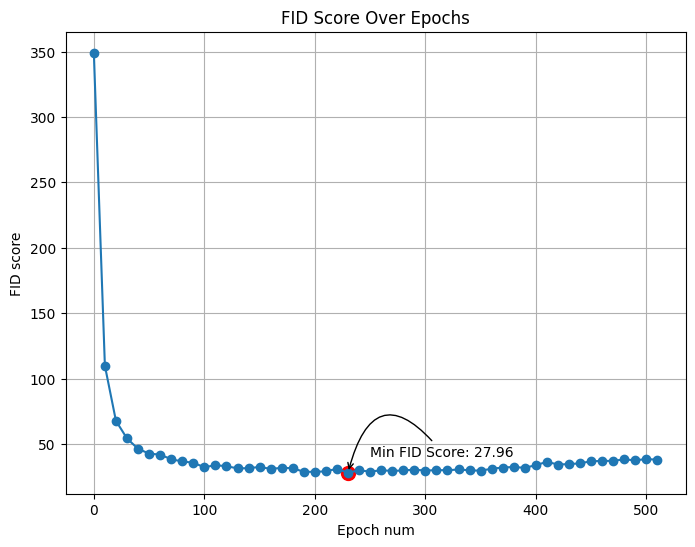

237/237 [==============================] - 50s 210ms/step - d_loss: 0.0670 - g_loss: -5.0561 - lr: 1.2930e-04
Epoch 512/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0818 - g_loss: -5.0692 - lr: 1.2930e-04
Epoch 513/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0741 - g_loss: -5.0739 - lr: 1.2930e-04
Epoch 514/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0929 - g_loss: -5.0497 - lr: 1.2930e-04
Epoch 515/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0635 - g_loss: -5.0713 - lr: 1.2930e-04
Epoch 516/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0502 - g_loss: -4.9871 - lr: 1.2930e-04
Epoch 517/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0912 - g_loss: -4.9969 - lr: 1.2930e-04
Epoch 518/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0823 - g_loss: -4.9986 - lr: 1.2929e-04
Epoch 519/802
237/237 

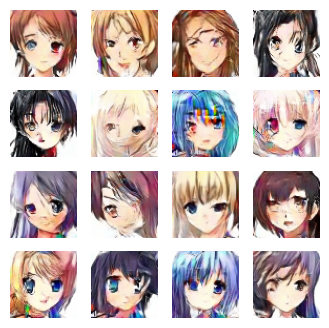

animeGenerated_wgan_520epochs


Output of the calculating FID command:
FID:  37.71999851119935

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.0614

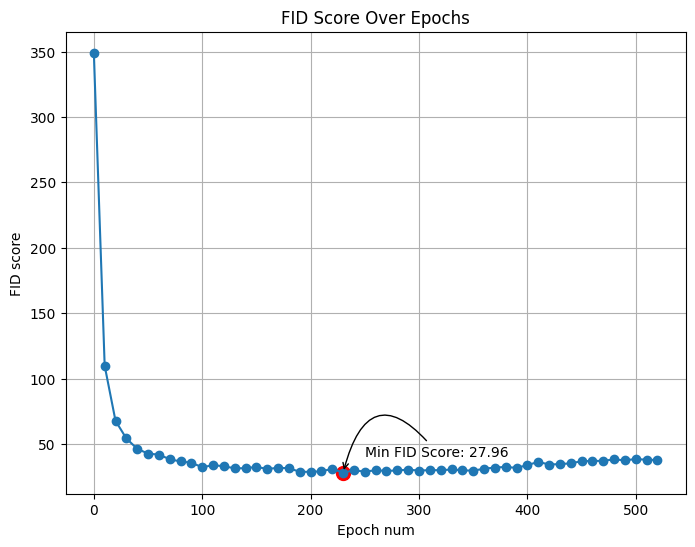

237/237 [==============================] - 49s 208ms/step - d_loss: 0.1037 - g_loss: -4.9919 - lr: 1.2929e-04
Epoch 522/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0366 - g_loss: -4.9843 - lr: 1.2929e-04
Epoch 523/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0695 - g_loss: -5.0258 - lr: 1.2929e-04
Epoch 524/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0926 - g_loss: -5.0584 - lr: 1.2929e-04
Epoch 525/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0402 - g_loss: -5.0645 - lr: 1.2928e-04
Epoch 526/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.0797 - g_loss: -5.0915 - lr: 1.2928e-04
Epoch 527/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0762 - g_loss: -5.1119 - lr: 1.2928e-04
Epoch 528/802
237/237 [==============================] - 32s 137ms/step - d_loss: 0.0943 - g_loss: -5.1021 - lr: 1.2928e-04
Epoch 529/802
237/237 

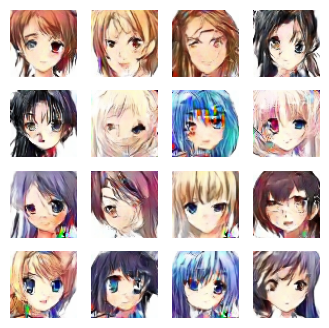

animeGenerated_wgan_530epochs


Output of the calculating FID command:
FID:  39.662857806050226

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

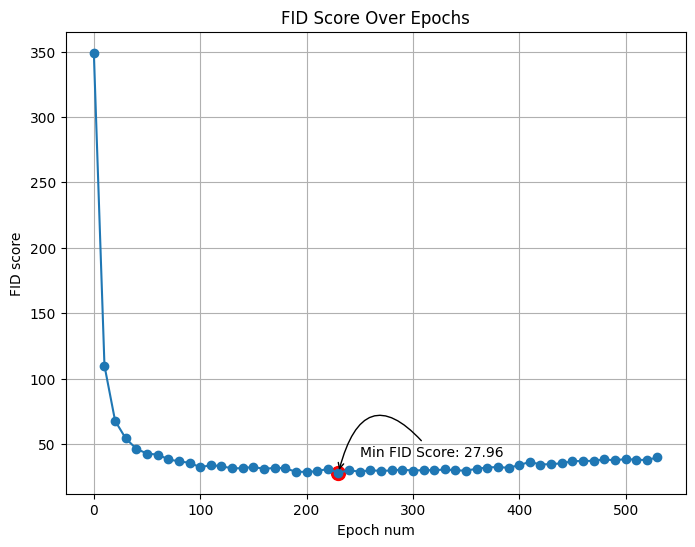

237/237 [==============================] - 49s 208ms/step - d_loss: 0.1030 - g_loss: -5.2039 - lr: 1.2928e-04
Epoch 532/802
237/237 [==============================] - 33s 137ms/step - d_loss: 29.6697 - g_loss: -27.2890 - lr: 1.2927e-04
Epoch 533/802
237/237 [==============================] - 32s 137ms/step - d_loss: 303.5835 - g_loss: -244.1163 - lr: 1.2927e-04
Epoch 534/802
237/237 [==============================] - 33s 137ms/step - d_loss: 269.4909 - g_loss: -227.0140 - lr: 1.2927e-04
Epoch 535/802
237/237 [==============================] - 33s 137ms/step - d_loss: 186.4514 - g_loss: -164.2646 - lr: 1.2927e-04
Epoch 536/802
237/237 [==============================] - 33s 137ms/step - d_loss: 122.5798 - g_loss: -116.7356 - lr: 1.2927e-04
Epoch 537/802
237/237 [==============================] - 33s 137ms/step - d_loss: 84.6714 - g_loss: -95.3069 - lr: 1.2927e-04
Epoch 538/802
237/237 [==============================] - 33s 137ms/step - d_loss: 43.7497 - g_loss: -66.3262 - lr: 1.2927e-04


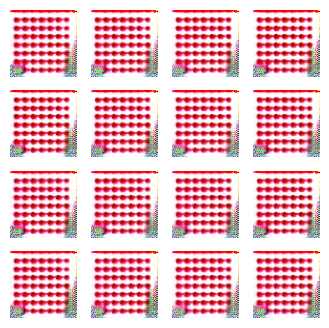

animeGenerated_wgan_540epochs


Output of the calculating FID command:
FID:  332.75369909492974

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

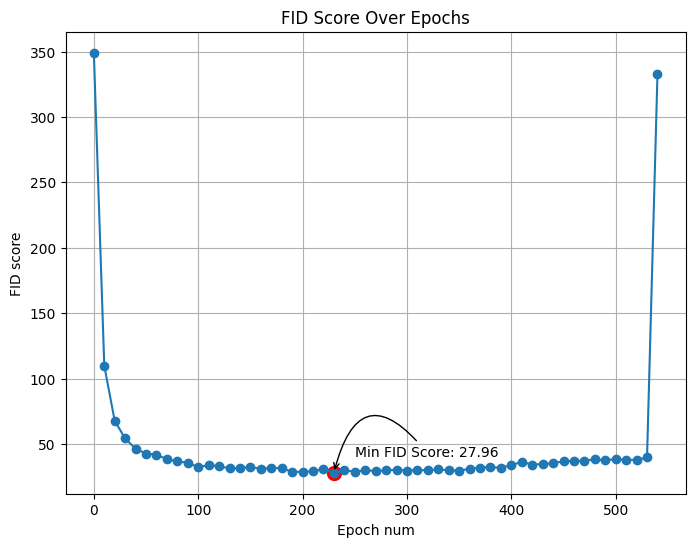

237/237 [==============================] - 50s 209ms/step - d_loss: -5.0509 - g_loss: -35.0829 - lr: 1.2926e-04
Epoch 542/802
237/237 [==============================] - 33s 137ms/step - d_loss: 12.7576 - g_loss: -46.2622 - lr: 1.2926e-04
Epoch 543/802
237/237 [==============================] - 33s 137ms/step - d_loss: 7.0146 - g_loss: -34.8498 - lr: 1.2926e-04
Epoch 544/802
237/237 [==============================] - 32s 137ms/step - d_loss: 7.2523 - g_loss: -30.0159 - lr: 1.2926e-04
Epoch 545/802
237/237 [==============================] - 33s 137ms/step - d_loss: 3.0568 - g_loss: -23.7621 - lr: 1.2926e-04
Epoch 546/802
237/237 [==============================] - 33s 137ms/step - d_loss: 1.7300 - g_loss: -23.7838 - lr: 1.2926e-04
Epoch 547/802
237/237 [==============================] - 33s 137ms/step - d_loss: 5.7707 - g_loss: -27.3701 - lr: 1.2925e-04
Epoch 548/802
237/237 [==============================] - 33s 137ms/step - d_loss: 1.8185 - g_loss: -17.5541 - lr: 1.2925e-04
Epoch 549/80

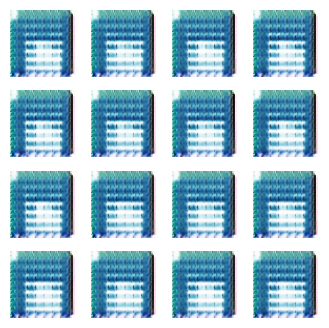

animeGenerated_wgan_550epochs


Output of the calculating FID command:
FID:  417.1831069101723

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.0614

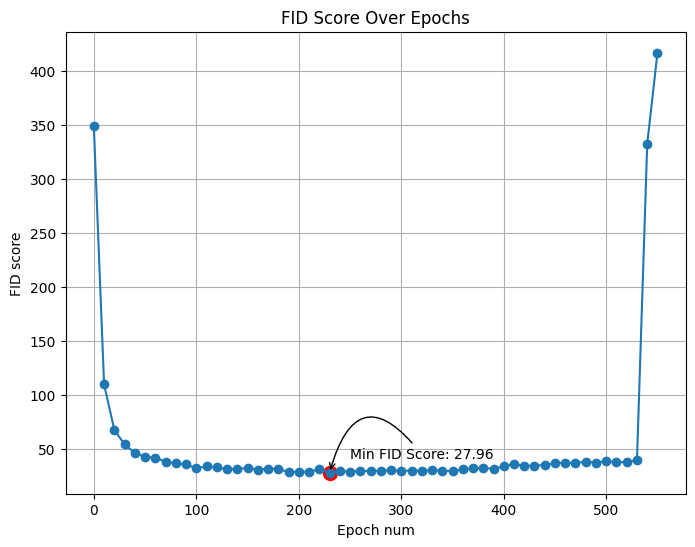

237/237 [==============================] - 49s 208ms/step - d_loss: 1.0121 - g_loss: -17.9410 - lr: 1.2925e-04
Epoch 552/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.1601 - g_loss: -18.8557 - lr: 1.2925e-04
Epoch 553/802
237/237 [==============================] - 33s 137ms/step - d_loss: 1.1403 - g_loss: -17.6924 - lr: 1.2925e-04
Epoch 554/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.9024 - g_loss: -14.2935 - lr: 1.2924e-04
Epoch 555/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.9283 - g_loss: -14.2806 - lr: 1.2924e-04
Epoch 556/802
237/237 [==============================] - 33s 137ms/step - d_loss: 1.0578 - g_loss: -12.6943 - lr: 1.2924e-04
Epoch 557/802
237/237 [==============================] - 33s 137ms/step - d_loss: 1.2685 - g_loss: -13.2737 - lr: 1.2924e-04
Epoch 558/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.9312 - g_loss: -10.4608 - lr: 1.2924e-04
Epoch 559/802


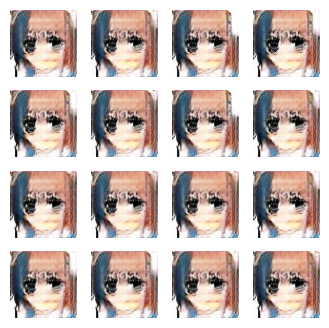

animeGenerated_wgan_560epochs


Output of the calculating FID command:
FID:  266.09011149099626

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

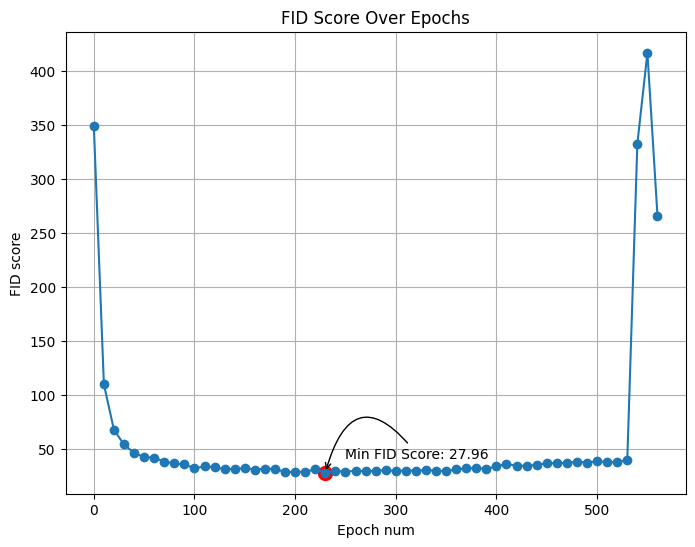

237/237 [==============================] - 49s 207ms/step - d_loss: 0.9649 - g_loss: -11.3490 - lr: 1.2924e-04
Epoch 562/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.9297 - g_loss: -11.0386 - lr: 1.2923e-04
Epoch 563/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.6295 - g_loss: -10.9179 - lr: 1.2923e-04
Epoch 564/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.5665 - g_loss: -10.9788 - lr: 1.2923e-04
Epoch 565/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.5233 - g_loss: -11.0017 - lr: 1.2923e-04
Epoch 566/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.7841 - g_loss: -10.9400 - lr: 1.2923e-04
Epoch 567/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.7704 - g_loss: -10.0793 - lr: 1.2923e-04
Epoch 568/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.7382 - g_loss: -9.5588 - lr: 1.2923e-04
Epoch 569/802
2

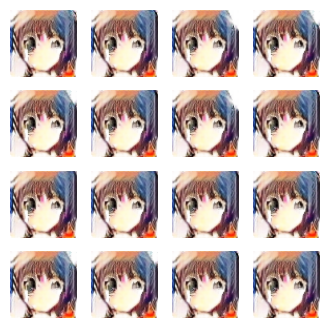

animeGenerated_wgan_570epochs


Output of the calculating FID command:
FID:  186.32701810023377

FID_scores:  [349.09119950908666, 109.76413077383626, 67.63711724419446, 54.17792023468169, 46.24512982697689, 42.58554579167435, 41.799834301086065, 38.28413983024282, 36.552672562889626, 35.62966790121902, 32.12131455903199, 33.77152990459962, 32.910100872136354, 31.333193836872653, 31.40649356927557, 32.40944126385352, 30.858607668473496, 31.700946838710195, 31.440531399025048, 28.641833870754255, 28.682006210154185, 29.00889682983535, 30.980858534018267, 27.96433543617698, 29.8192596660528, 28.78182911247245, 29.860347426739366, 29.336004609841723, 29.709822285667144, 30.34694758000245, 29.585864031830198, 29.96241578338541, 29.859312877207287, 30.43232266573284, 29.800333600619638, 29.524602831801303, 31.014105496279115, 31.942959063763794, 32.351914074984734, 31.69444619245934, 33.78157933834751, 36.261314477338146, 34.24421383273548, 34.5473079972127, 35.146585551397436, 36.76944078013702, 36.94539401764541, 37.061

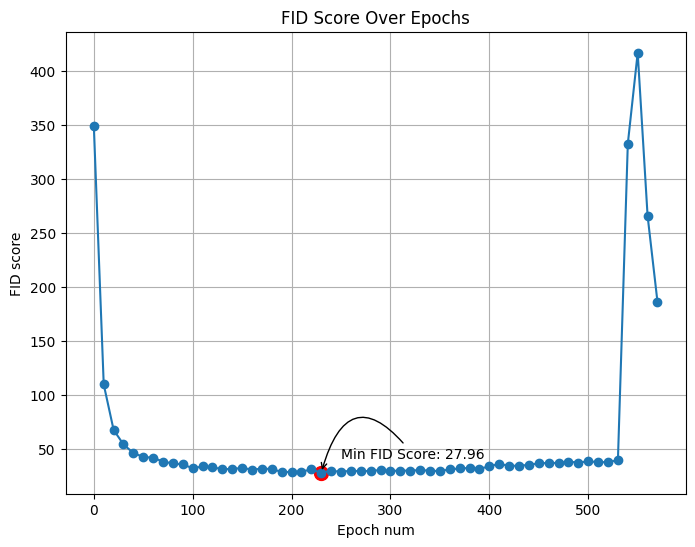

237/237 [==============================] - 50s 212ms/step - d_loss: 0.6300 - g_loss: -10.3008 - lr: 1.2922e-04
Epoch 572/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.4986 - g_loss: -11.3555 - lr: 1.2922e-04
Epoch 573/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.5340 - g_loss: -11.2215 - lr: 1.2922e-04
Epoch 574/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.4326 - g_loss: -11.3113 - lr: 1.2922e-04
Epoch 575/802
237/237 [==============================] - 33s 137ms/step - d_loss: 0.4559 - g_loss: -12.3935 - lr: 1.2922e-04
Epoch 576/802
 32/237 [===>..........................] - ETA: 28s - d_loss: 0.4519 - g_loss: -12.3750

In [ ]:
NUM_EPOCHS = 802 # number of epochs
wgan_gp.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM), lr_scheduler]) # new: add lr_scheduler